In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows', 500)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

### EDA dữ liệu

In [3]:
train_identity = pd.read_csv('data/train_identity.csv')
train_transaction = pd.read_csv('data/train_transaction.csv')

In [4]:
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
del train_identity, train_transaction

In [5]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [6]:
column_data_types = train.dtypes

chunk_size = 20
num_columns = len(column_data_types)

for i in range(0, num_columns, chunk_size):
    chunk_end = min(i + chunk_size, num_columns)
    chunk = column_data_types.index[i:chunk_end]

    print(column_data_types[chunk])
    print('\n' + '-' * 80 + '\n')

TransactionID       int64
isFraud             int64
TransactionDT       int64
TransactionAmt    float64
ProductCD          object
card1               int64
card2             float64
card3             float64
card4              object
card5             float64
card6              object
addr1             float64
addr2             float64
dist1             float64
dist2             float64
P_emaildomain      object
R_emaildomain      object
C1                float64
C2                float64
C3                float64
dtype: object

--------------------------------------------------------------------------------

C4     float64
C5     float64
C6     float64
C7     float64
C8     float64
C9     float64
C10    float64
C11    float64
C12    float64
C13    float64
C14    float64
D1     float64
D2     float64
D3     float64
D4     float64
D5     float64
D6     float64
D7     float64
D8     float64
D9     float64
dtype: object

--------------------------------------------------------------------

In [7]:
train.describe()


,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,238269.000000,37627.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,589271.000000,309743.000000,327662.000000,421618.000000,280699.000000,73187.000000,38917.000000,74926.000000,74926.000000,514518.000000,311253.000000,64717.000000,61952.000000,62187.000000,501427.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,...,589271.000000,589271.000000,589271.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.00000,82351.000000,82351.000000,82351.000000,82351.000000,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,5155.000000,5155.000000,74926.000000,74926.000000,140978.000000,127320.000000,80044.000000,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,118.502180,231.855423,14.092458,15.269734,0.005644,4.092185,5.571526,9.071082,2.848478,5.144574,4.480240,5.240343,10.241521,4.076227,32.539918,8.295215,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,0.561057,123.982137,146.621465,54.037533,17.901295,57.724444,163.744579,0.999945,1.045204,1.078075,0.846456,0.876991,1.045686,1.072870,1.027704,1.041529,...,21.351473,43.319174,26.806977,109.818544,247.606741,162.153398,18.372476,42.073133,28.326584,6.220289,13.103775,9.184612,0.058494,0.851040,0.296633,0.336790,1.312844,0.775874,721.741883,1375.783644,1014.622782,9.807015,59.16455,28.530903,55.352422,151.160542,100.700882,-10.170502,174716.584708,0.060189,-0.058938,1.615585,-6.698710,13.285354,-38.600388,0.091023,-0.301124,99.745325,48.053071,-344.507146,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,371.872026,529.053494,133.569018,154.668899,0.150536,68.848459,25.786976,71.508467,61.727304,95.378574,16.674897,95.581443,94.336292,86.666218,129.364844,49.544262,157.660387,177.315865,62.384721,191.096774,89.000144,143.669253,99.743264,231.663840,0.316880,182.615225,186.042622,124.274558,67.614425,136.312450,202.726660,0.007390,0.240133,0.320890,0.440053,0.475902,0.239385,0.304779,0.186069,0.226339,...,95.902970,173.619028,116.853222,2270.033202,3980.042828,2793.343636,332.304848,473.499307,382.053171,56.022561,106.739813,73.627893,0.304415,3.950295,1.364356,1.580144,8.769083,4.727971,6217.223583,11169.275702,7955.735482,243.861391,387.62948,274.576920,668.486833,1095.034387,814.946722,14.347949,159651.816856,0.598231,0.701015,5.249856,16.491104,11.384207,26.084899,0.983842,2.789446,1.127602,11.774858,93.695502,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000

In [8]:
def detectmissing(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing(%)'] = df.isnull().sum().values / df.shape[0]*100
    summary['Uniques'] = df.nunique().values

    return summary

def calculate_outliers(df_num):
    data_mean, data_std = np.mean(df_num), np.std(df_num)
    cut = data_std * 3
    lower, upper = data_mean - cut, data_mean + cut

    outliers_lower = [x for x in df_num if x < lower]
    outliers_higher = [x for x in df_num if x > upper]
    outliers_total = [x for x in df_num if x < lower or x > upper]
    outliers_removed = [x for x in df_num if x > lower and x < upper]

    outlier_stats = {
        'Number of values below lower bound': len(outliers_lower),
        'Number of values above upper bound': len(outliers_higher),
        'Total number of outlier values': len(outliers_total),
        'Total number of non-outlier values': len(outliers_removed),
        'Percentage of Outliers': round((len(outliers_total) / len(outliers_removed)) * 100, 4)
    }

    print("Outlier Statistics:")
    for stat_name, stat_value in outlier_stats.items():
        print(f'{stat_name}: {stat_value}')

In [9]:
train_missing = detectmissing(train)
train_missing

,Name,dtypes,Missing(%),Uniques
0,TransactionID,int64,0.000000,590540
1,isFraud,int64,0.000000,2
2,TransactionDT,int64,0.000000,573349
3,TransactionAmt,float64,0.000000,20902
4,ProductCD,object,0.000000,5
5,card1,int64,0.000000,13553
6,card2,float64,1.512683,500
7,card3,float64,0.265012,114
8,card4,object,0.267044,4
9,card5,float64,0.721204,119


In [10]:
print("Missing value in the train set:")
for i in [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 99]:
    print("%0.2f percent of features have more than " % ((len(train_missing[train_missing['Missing(%)'] >i])/ train.shape[1])*100) + str(i) + "% of missing value")

Missing value in the train set:
95.39 percent of features have more than 0% of missing value
74.19 percent of features have more than 10% of missing value
58.06 percent of features have more than 20% of missing value
53.46 percent of features have more than 30% of missing value
53.46 percent of features have more than 40% of missing value
49.31 percent of features have more than 50% of missing value
47.93 percent of features have more than 60% of missing value
47.93 percent of features have more than 70% of missing value
17.05 percent of features have more than 80% of missing value
2.76 percent of features have more than 90% of missing value
2.07 percent of features have more than 99% of missing value


In [11]:
col_70missing = train_missing[train_missing['Missing(%)'] >70]['Name'].to_list()
print('The number of features with more than 70% missing value in Train is: ')
len(col_70missing)

The number of features with more than 70% missing value in Train is: 


208

In [ ]:
one_unique_col = [i for i in train.columns if train[i].nunique() == 1]
#one_unique_col_test = [i for i in test.columns if test[i].nunique() == 1]
print("There are %d features in train set with only one unique value" % len(one_unique_col))
#print("There are %d features in test set with only one unique value" % len(one_unique_col_test))
#print("The feature is %s" % one_unique_col_test[0])

There are 0 features in train set with only one unique value


### Xử lý các cột V

In [ ]:
v_columns = ['V' + str(i) for i in range(1,340)]

In [ ]:
df_v_col = train[v_columns]
df_v_col.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,...,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Đây là các cột chứa nhiều thông tin liên quan được Vesta corporation tự tạo ra và thêm vào, nhưng ý nghĩa thực sự của chúng đã bị ẩn đi.

Đầu tiên, khi chúng tôi khảo sát số lượng dữ liệu bị mất đi, chúng tôi thấy được có rất nhiều cột với số lượng dữ liệu NaNs giống nhau.

Điều này dẫn đến phỏng đoán của chúng tôi là có rất nhiều cột dữ liệu có nhiều tương quan với nhau, thậm chí là có thể có nhiều cột bị lặp lại dẫn đến việc dư thừa quá nhiều cột không cần thiết. Ta đã biết có nhiều cột tương quan là một điều không tốt cho việc dự đoán, và ta cần phải giảm đi số cột V này và chỉ giữ lại những cột V đặc trưng.

In [ ]:
detectmissing(df_v_col)

,Name,dtypes,Missing(%),Uniques
0,V1,float64,47.293494,2
1,V2,float64,47.293494,9
2,V3,float64,47.293494,10
3,V4,float64,47.293494,7
4,V5,float64,47.293494,7
5,V6,float64,47.293494,10
6,V7,float64,47.293494,10
7,V8,float64,47.293494,9
8,V9,float64,47.293494,9
9,V10,float64,47.293494,5


In [ ]:
# group columns by the number of missing values
nans_df = df_v_col.isnull()
nans_df.head()
nans_groups={}

for col in df_v_col.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]

del nans_df

for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 279287
['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
####### NAN count = 76073
['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
####### NAN count = 168969
['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']
####### NAN count = 77096
['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']
####### NAN count = 89164
['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']
####### NAN count = 314
['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V

Ta có thể thấy ở trên là có rất nhiều cột V có cấu trúc dữ liệu NaNs giống nhau (cùng số lượng giá trị bị thiếu NAN count).

In [ ]:
def make_plots(Vs):
    col = 4
    row = len(Vs)//4+1
    plt.figure(figsize=(20,row*5))
    idx = train[~train[Vs[0]].isna()].index
    for i,v in enumerate(Vs):
        plt.subplot(row,col,i+1)
        n = train[v].nunique()
        x = np.sum(train.loc[idx,v]!=train.loc[idx,v].astype(int))
        y = np.round(100*np.sum(train[v].isna())/len(train),2)
        t = 'int'
        if x!=0: t = 'float'
        plt.title(v+' has '+str(n)+' '+t+' and '+str(y)+'% nan')
        plt.yticks([])
        h = plt.hist(train.loc[idx,v],bins=100)
        if len(h[0])>1: plt.ylim((0,np.sort(h[0])[-2]))
    plt.show()

def make_corr(Vs,Vtitle=''):
    cols = Vs
    plt.figure(figsize=(15,15))
    sns.heatmap(df_v_col[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
    plt.show()

def reduce_group(grps,c='V'):
    use = []
    for g in grps:
        mx = 0; vx = g[0]
        for gg in g:
            n = train[c+str(gg)].nunique()
            if n>mx:
                mx = n
                vx = gg
            #print(str(gg)+'-'+str(n),', ',end='')
        use.append(vx)
        #print()
    print('Use these',use)
    return use

### Ví dụ nhóm đầu tiên: Nhóm của các cột V có số 279287 giá trị NaNs 

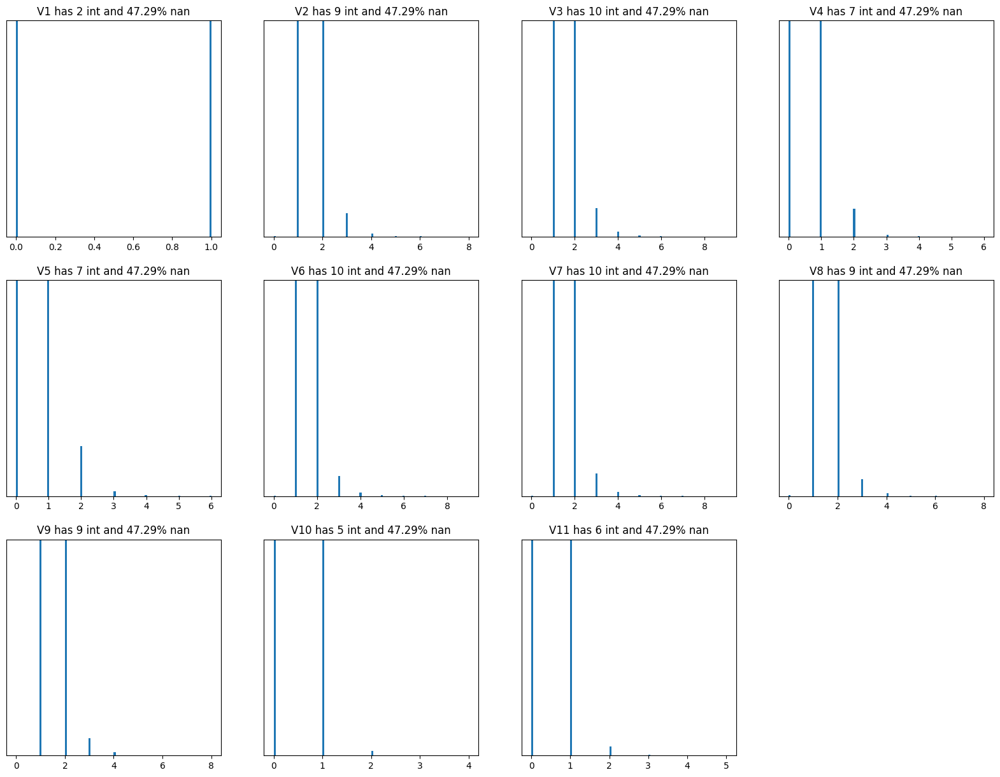

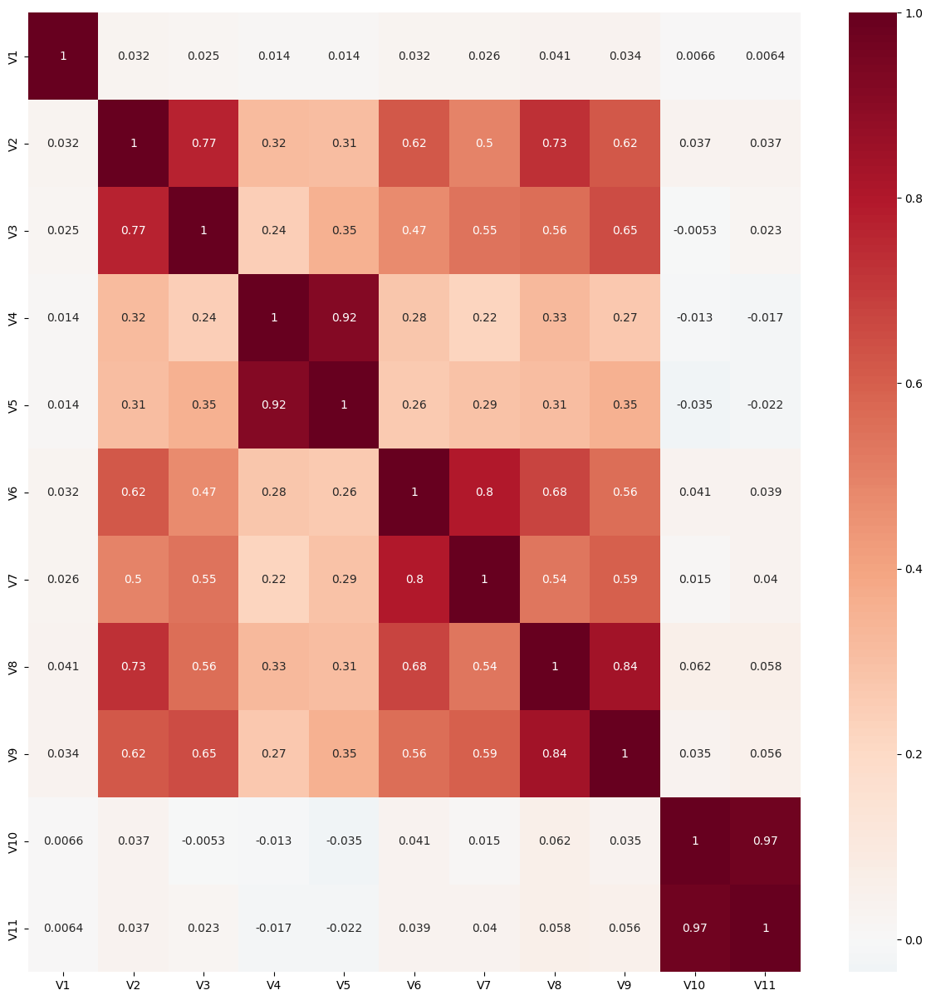

In [ ]:
Vs = nans_groups[279287]
make_plots(Vs)
make_corr(Vs)

In [ ]:
v = []

grps = [[1],[2,3],[4,5],[6,7],[8,9],[10,11]]

v += reduce_group(grps)

v

Use these [1, 3, 4, 6, 8, 11]


[1, 3, 4, 6, 8, 11]

Nhìn vào bức ảnh trên, ta có thể thấy là rất nhiều cột V đôi một tương quan với nhau, biểu thi bằng các vùng đỏ đậm. Trong các cột V có cùng số lượng dữ liệu missing như thế này, ta có thể nhóm chúng tiếp thành các nhóm trong đó các cột đều đôi một tương quan đáng kể với nhau (chỉ số correlation > 0.75). Sau đó, ta sẽ tiến hành chọn một cột đặc trưng duy nhất trong các nhóm nhỏ đó, và cột này sẽ được chọn với tiêu chí là chứa nhiều giá trị riêng (unique values) nhất để giữ lại nhiều thông tin nhất.

Như bức ảnh trên, các cột V đã được nhóm thành các nhóm sau: ``[[1],[2,3],[4,5],[6,7],[8,9],[10,11]]``. Trong mỗi nhóm nhỏ đấy, cột chứa nhiều unique values nhất sẽ được chọn, và ta sẽ được list các cột V cuối cùng như sau: ``[1, 3, 4, 6, 8, 11]``

Ta tiến hành lặp lại các bước chọn này với các nhóm cột V tiếp theo

### Lặp lại bước trên với các cột V ở nhóm ``NAN_count`` khác nhau

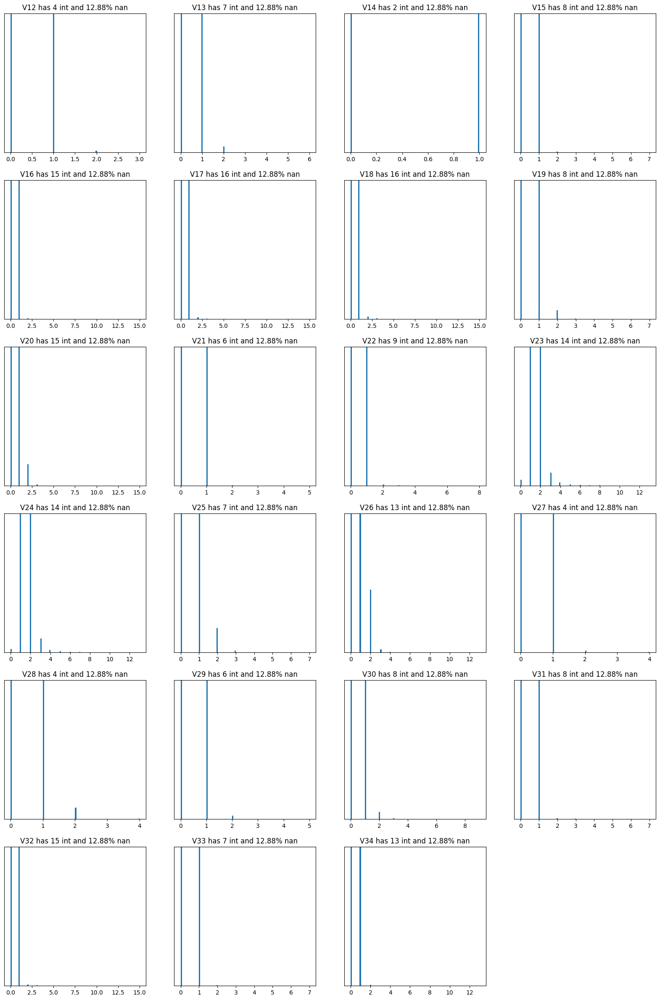

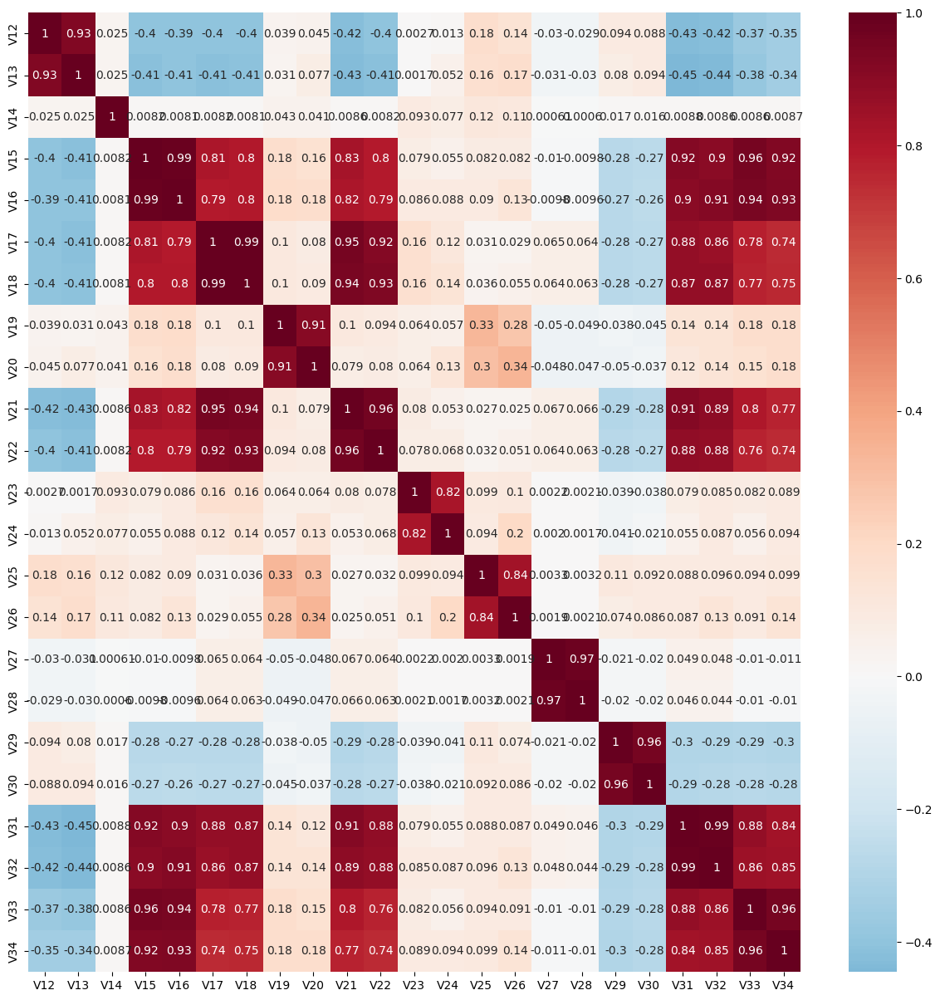

In [ ]:
Vs = nans_groups[76073]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[12,13],[14],[15,16,17,18,21,22,31,32,33,34],[19,20],[23,24],[25,26],[27,28],[29,30]]
v += reduce_group(grps)
v

Use these [13, 14, 17, 20, 23, 26, 27, 30]


[1, 3, 4, 6, 8, 11, 13, 14, 17, 20, 23, 26, 27, 30]

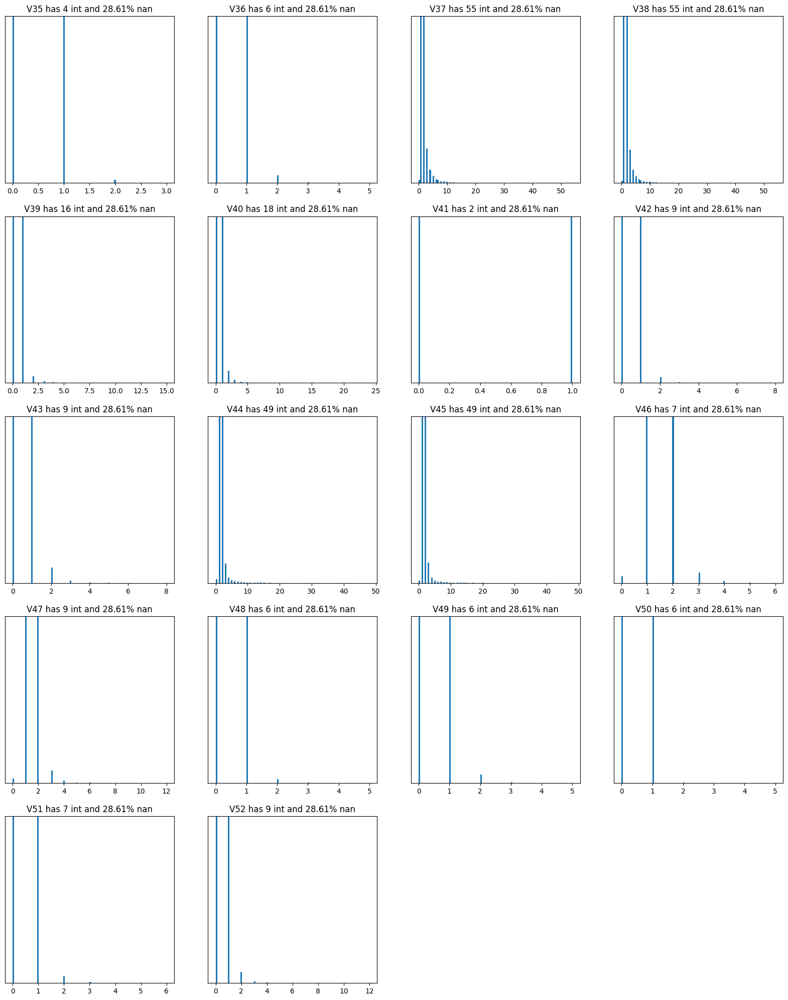

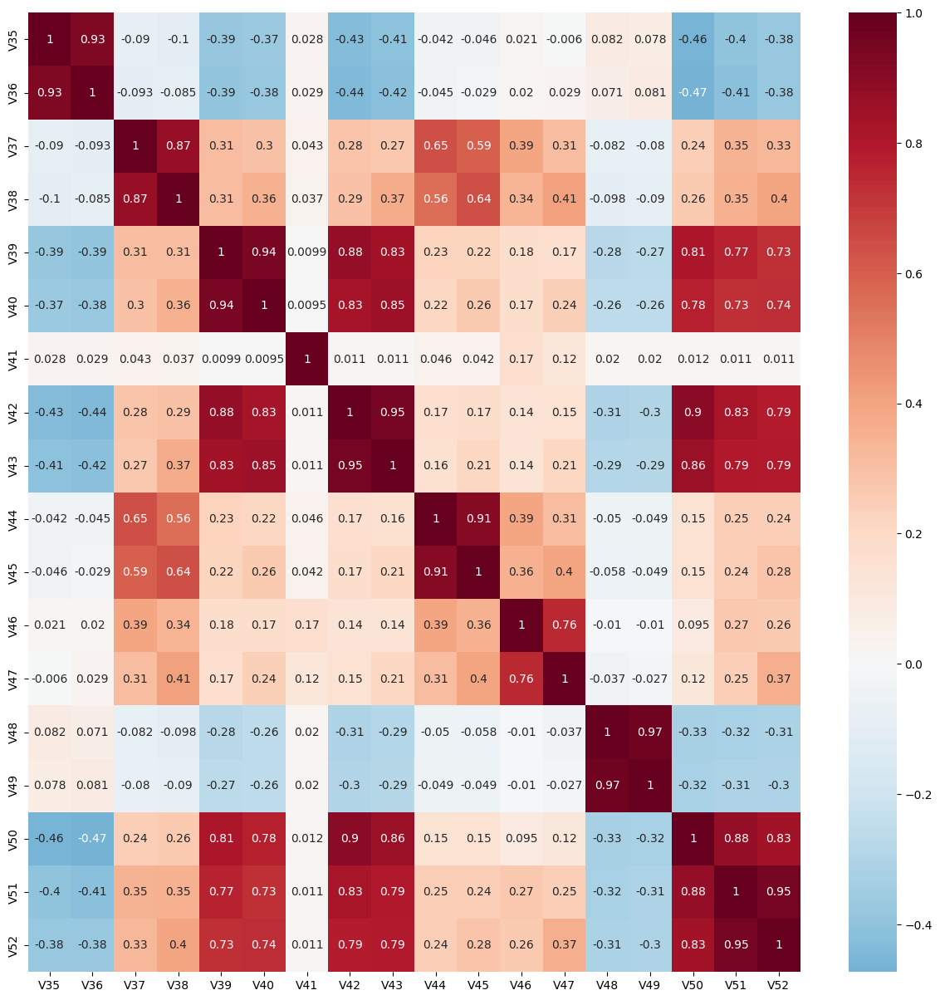

In [ ]:
Vs = nans_groups[168969]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[35,36],[37,38],[39,40,42,43,50,51,52],[41],[44,45],[46,47],[48,49]]
v += reduce_group(grps)
v

Use these [36, 37, 40, 41, 44, 47, 48]


[1, 3, 4, 6, 8, 11, 13, 14, 17, 20, 23, 26, 27, 30, 36, 37, 40, 41, 44, 47, 48]

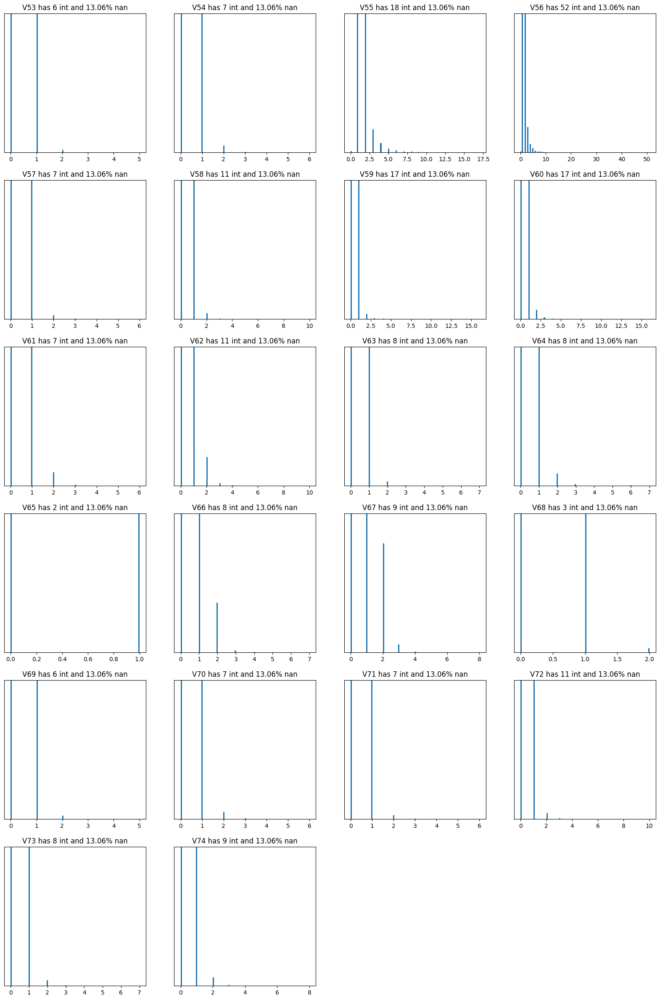

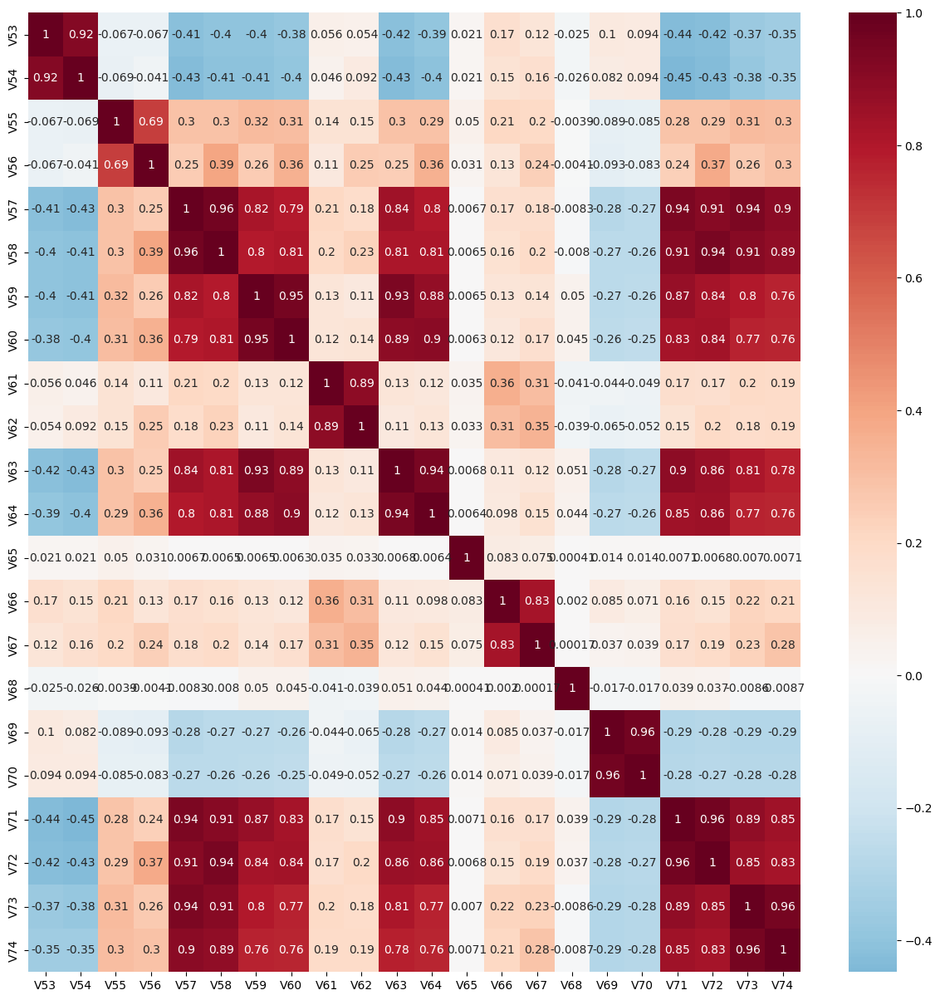

In [ ]:
Vs = nans_groups[77096]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[53,54],[55,56],[57,58,59,60,63,64,71,72,73,74],[61,62],[65],[66,67],[68],[69,70]]
v += reduce_group(grps)
v

Use these [54, 56, 59, 62, 65, 67, 68, 70]


[1,
 3,
 4,
 6,
 8,
 11,
 13,
 14,
 17,
 20,
 23,
 26,
 27,
 30,
 36,
 37,
 40,
 41,
 44,
 47,
 48,
 54,
 56,
 59,
 62,
 65,
 67,
 68,
 70]

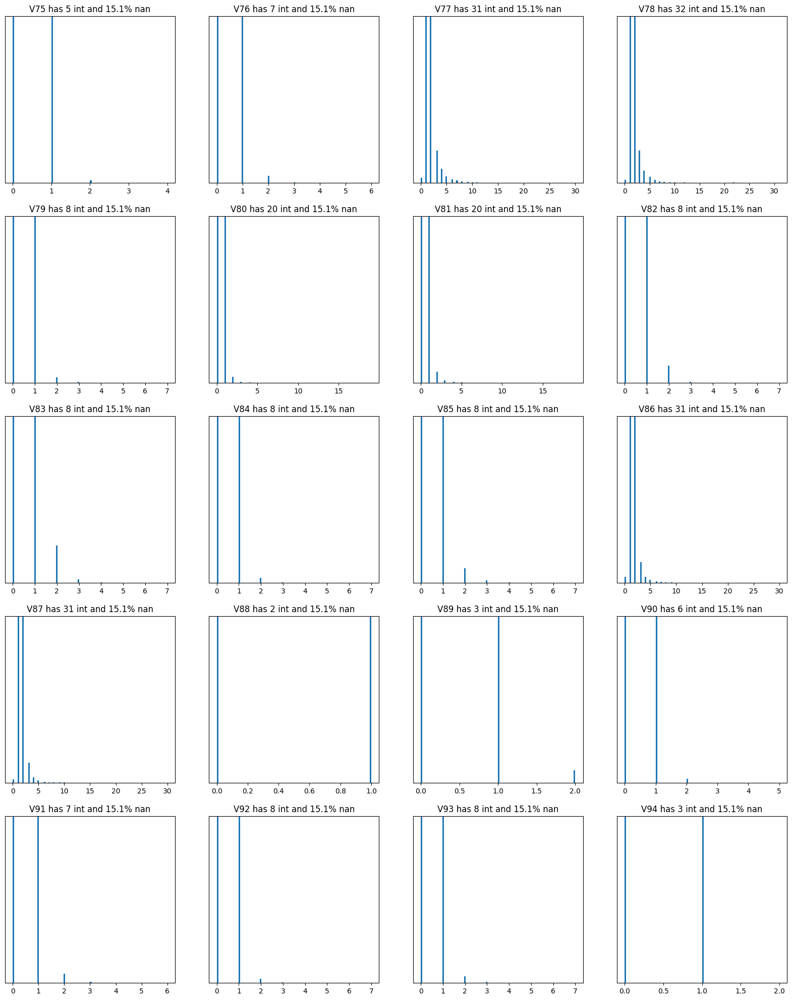

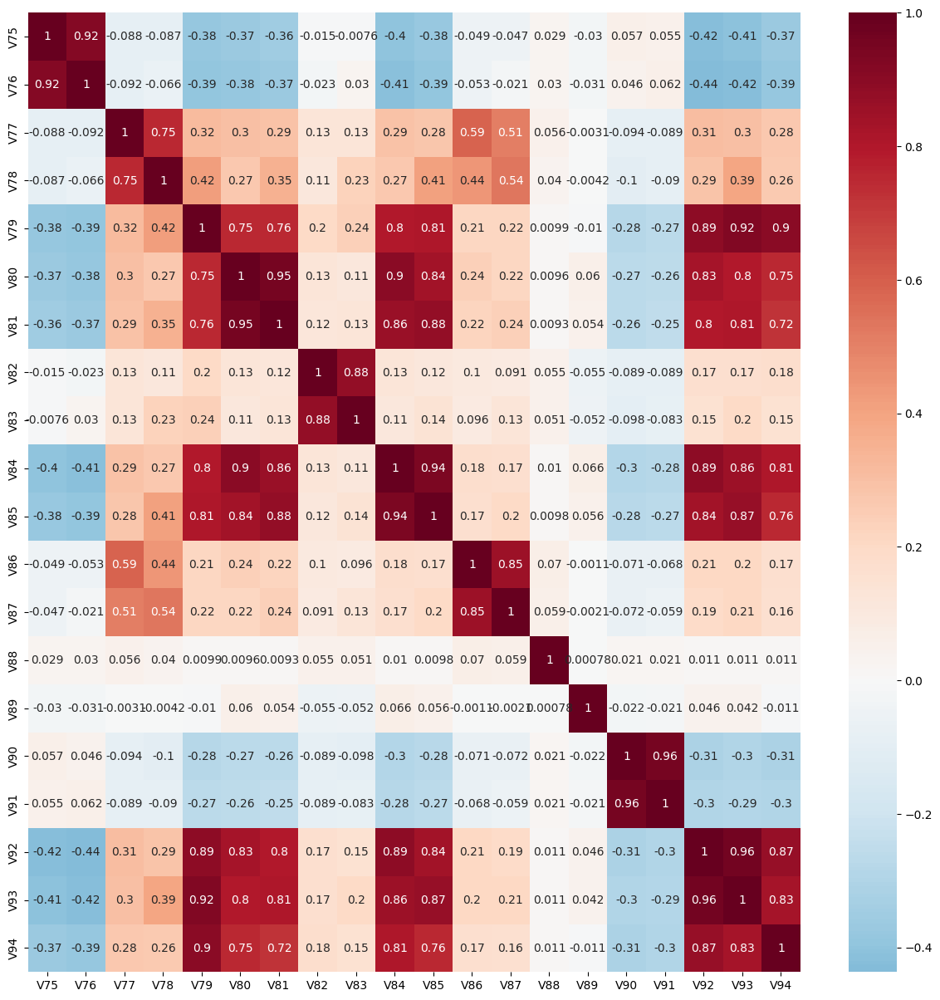

In [ ]:
Vs = nans_groups[89164]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[75,76],[77,78],[79,80,81,84,85,92,93,94],[82,83],[86,87],[88],[89],[90,91]]
v += reduce_group(grps)

Use these [76, 78, 80, 82, 86, 88, 89, 91]


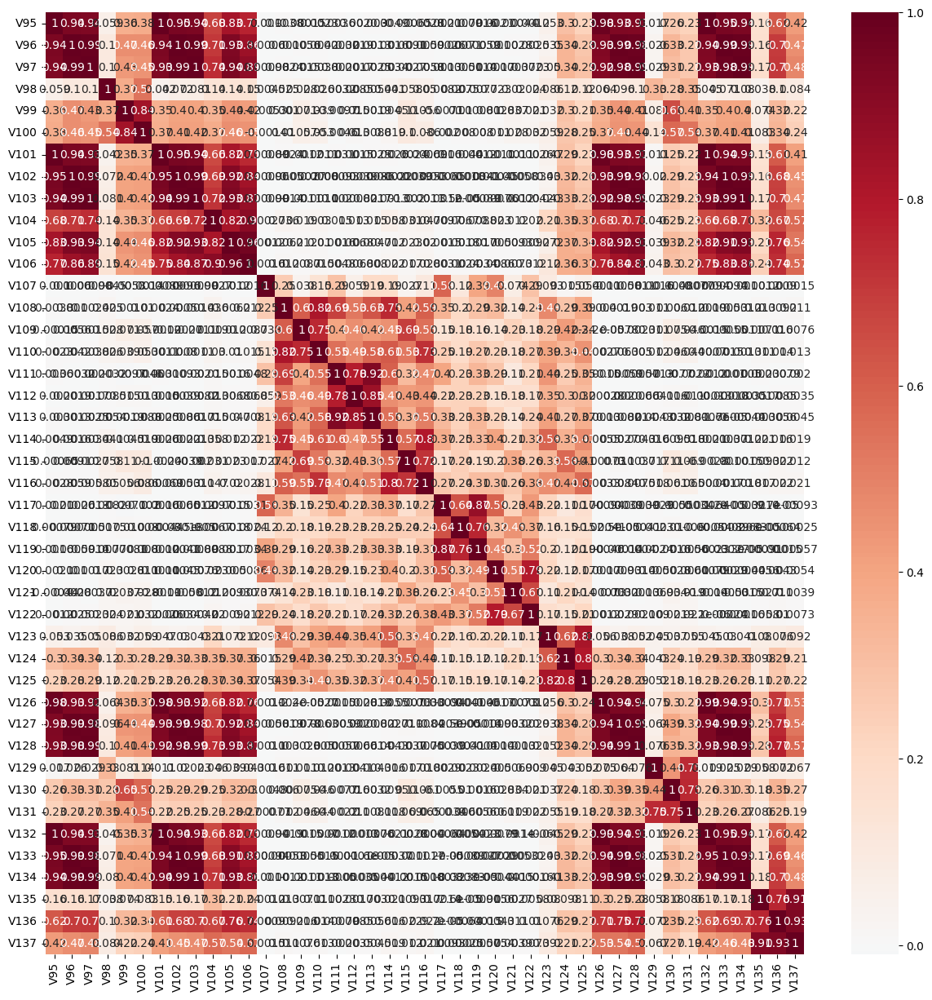

In [ ]:
Vs = nans_groups[314]
make_corr(Vs)

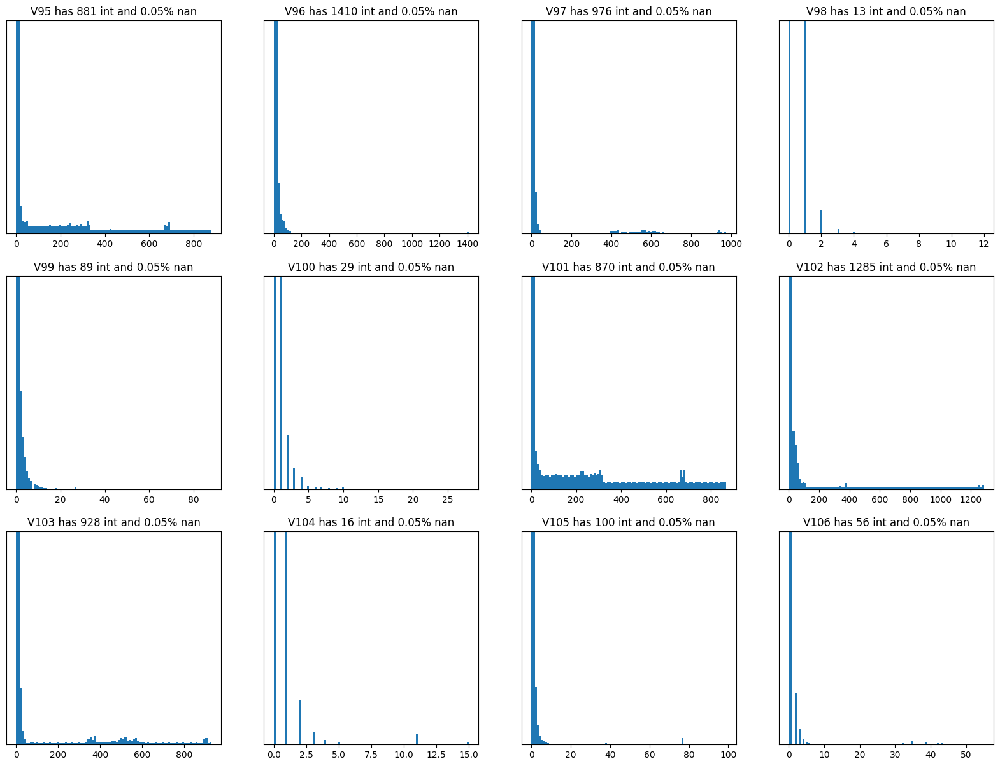

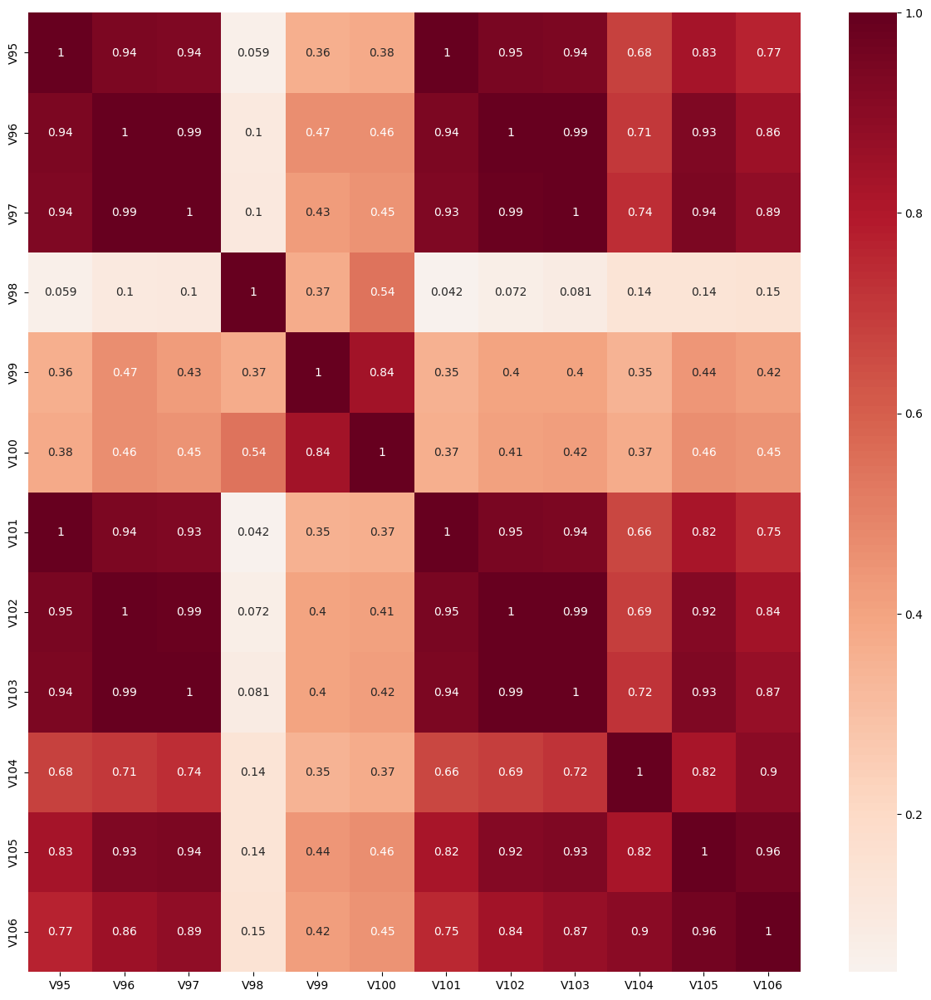

In [ ]:
Vs = ['V'+str(x) for x in range(95,107)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[95,96,97,101,102,103,105,106],[98],[99,100],[104]]
v += reduce_group(grps)

Use these [96, 98, 99, 104]


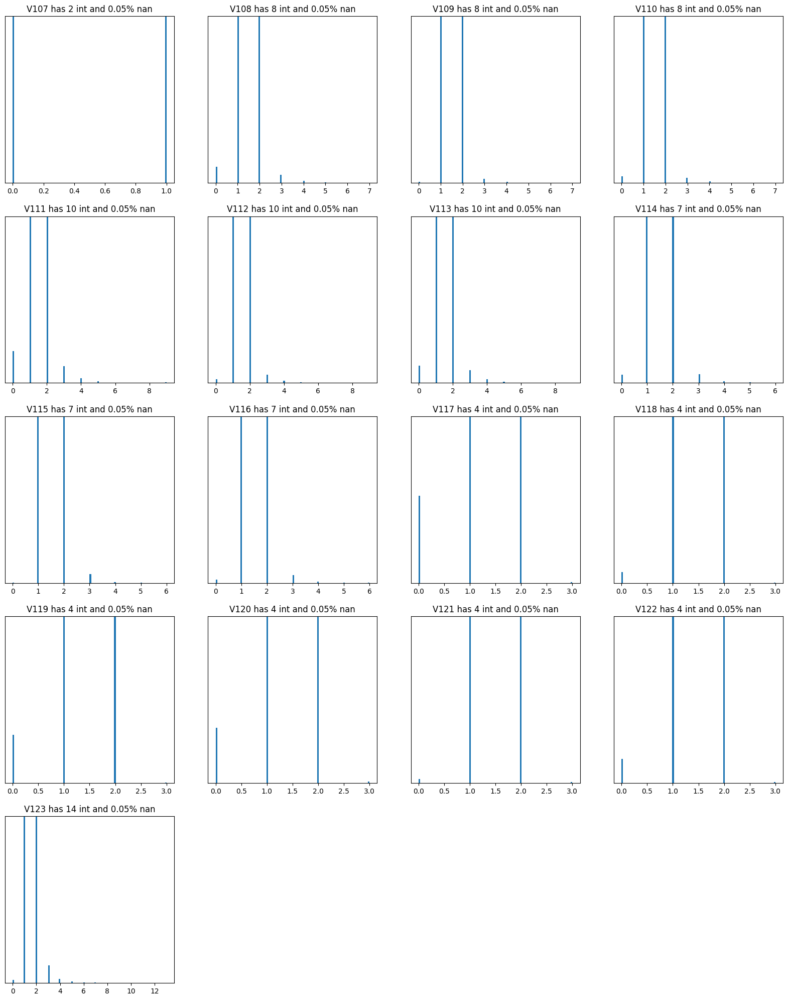

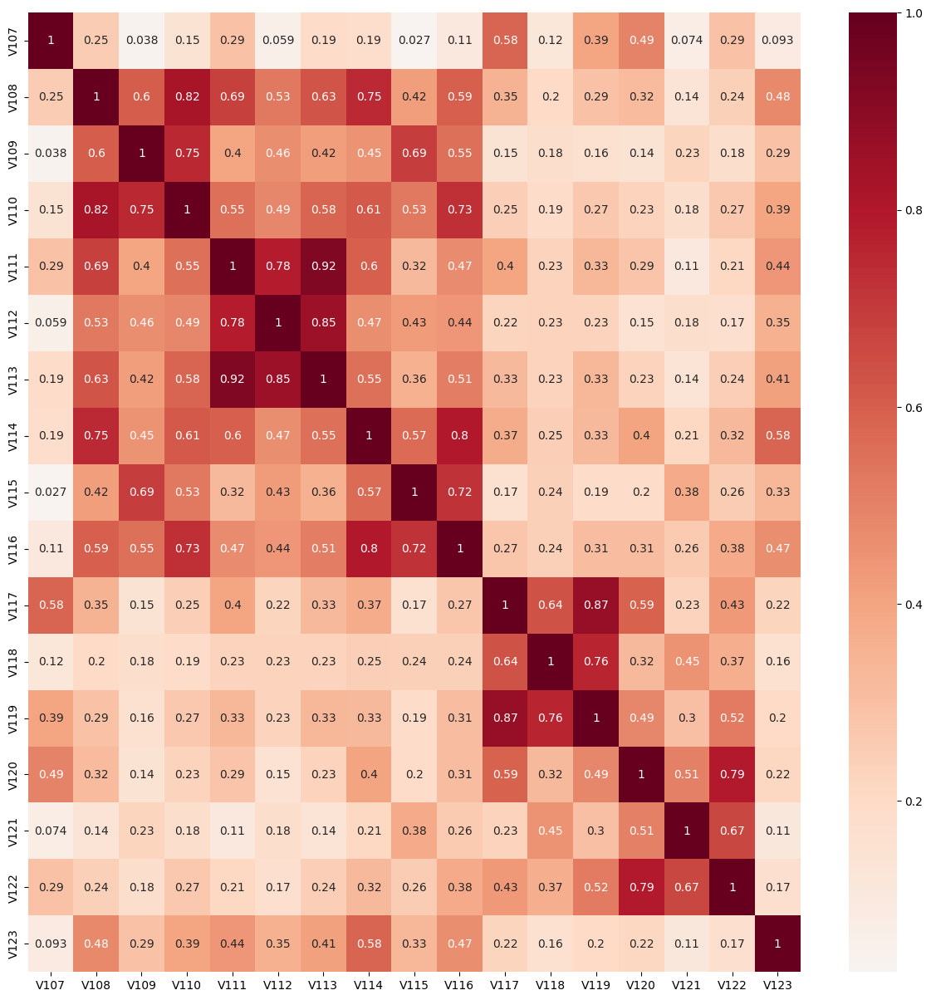

In [ ]:
Vs = ['V'+str(x) for x in range(107,124)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[107],[108,109,110,114],[111,112,113],[115,116],[117,118,119],[120,122],[121],[123]]
v += reduce_group(grps)

Use these [107, 108, 111, 115, 117, 120, 121, 123]


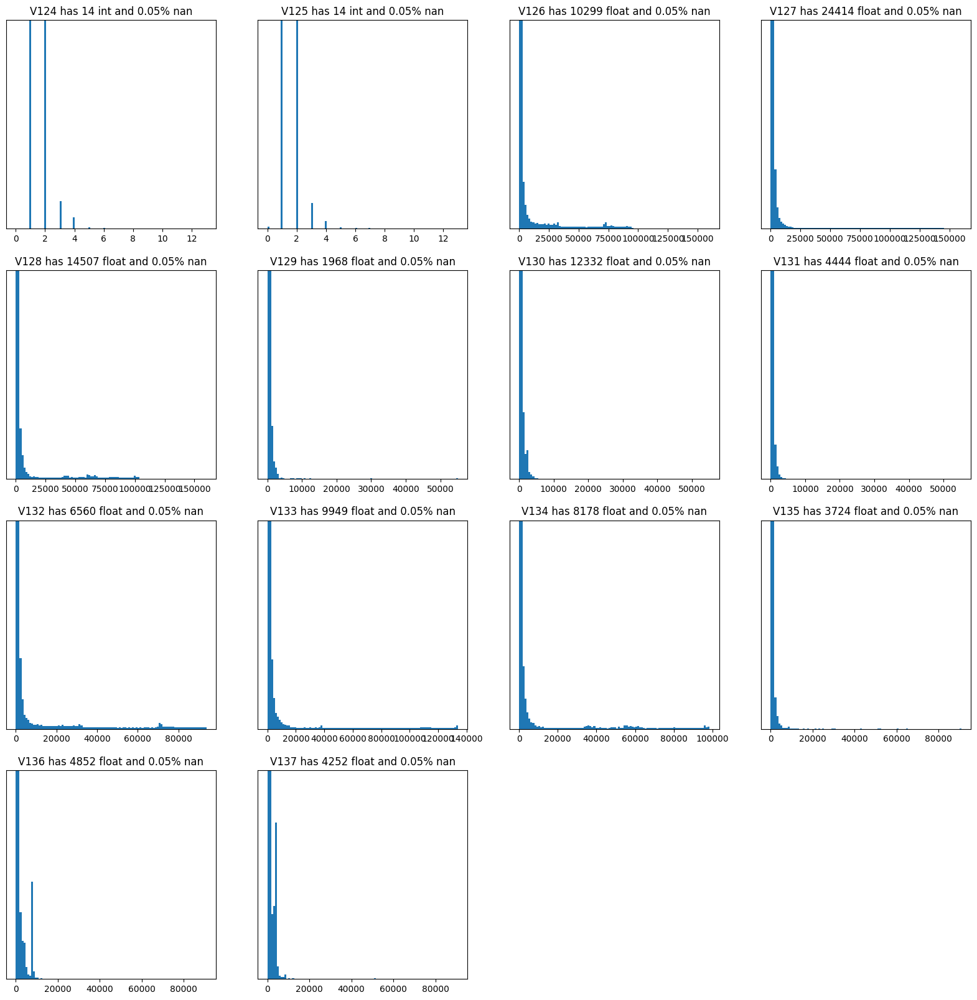

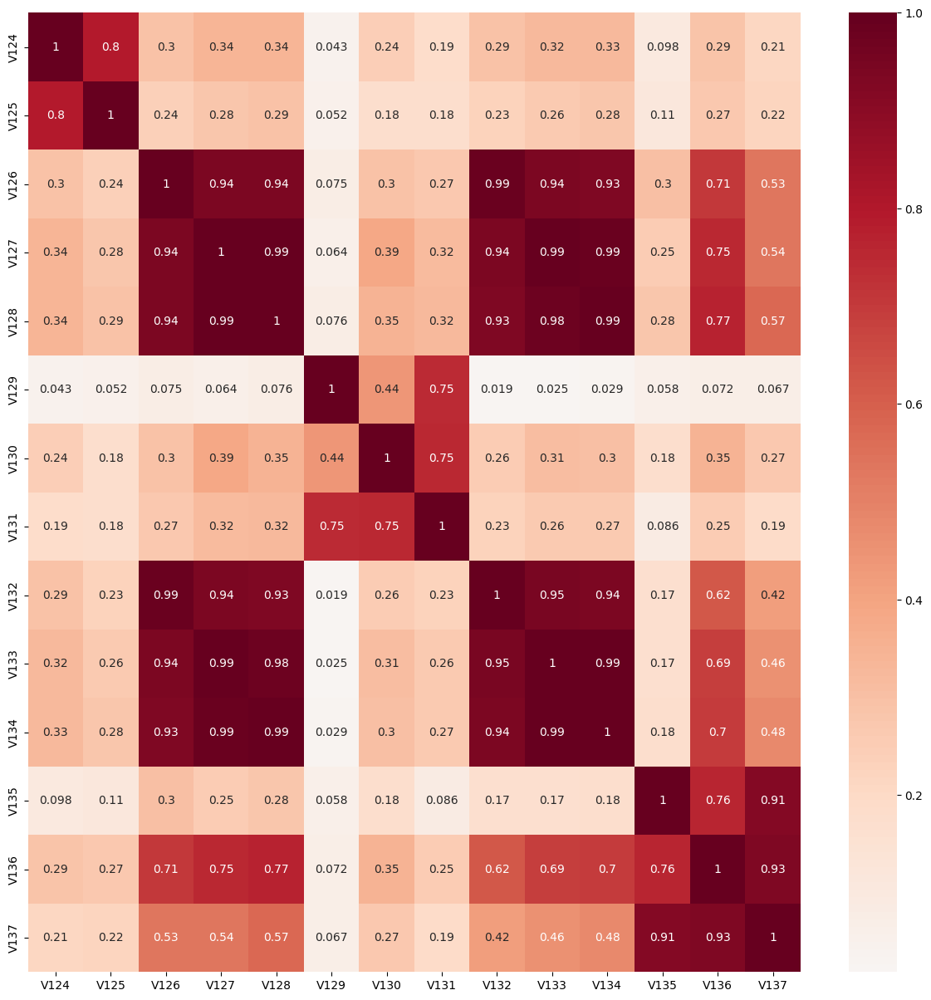

In [ ]:
Vs = ['V'+str(x) for x in range(124,138)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[124,125],[126,127,128,132,133,134],[129],[130,131],[135,136,137]]
v += reduce_group(grps)

Use these [124, 127, 129, 130, 136]


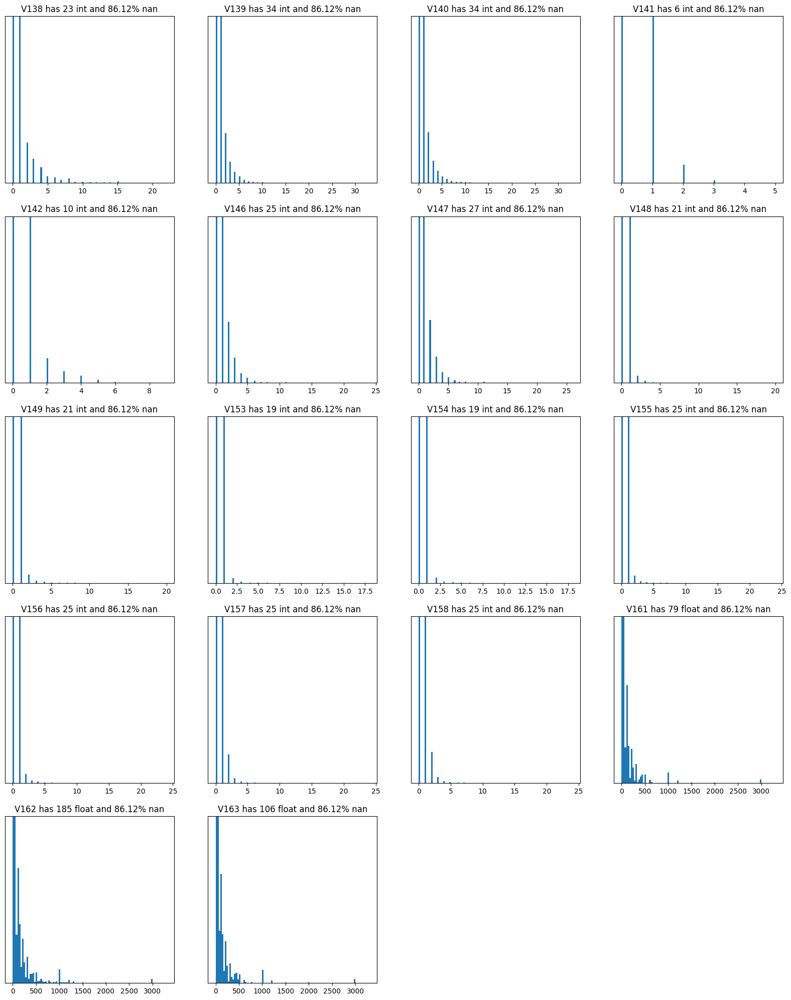

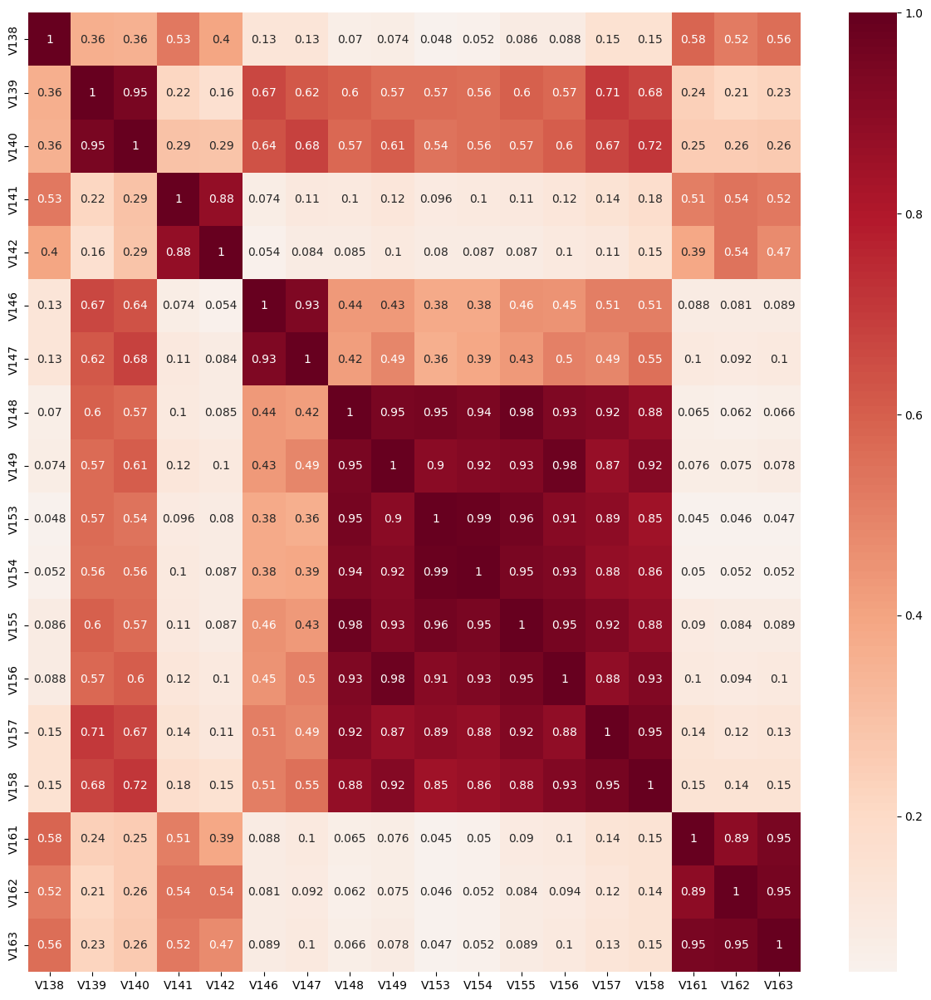

In [ ]:
Vs = nans_groups[508595]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[138],[139,140],[141,142],[146,147],[148,149,153,154,156,157,158],[161,162,163]]
v += reduce_group(grps)

Use these [138, 139, 142, 147, 156, 162]


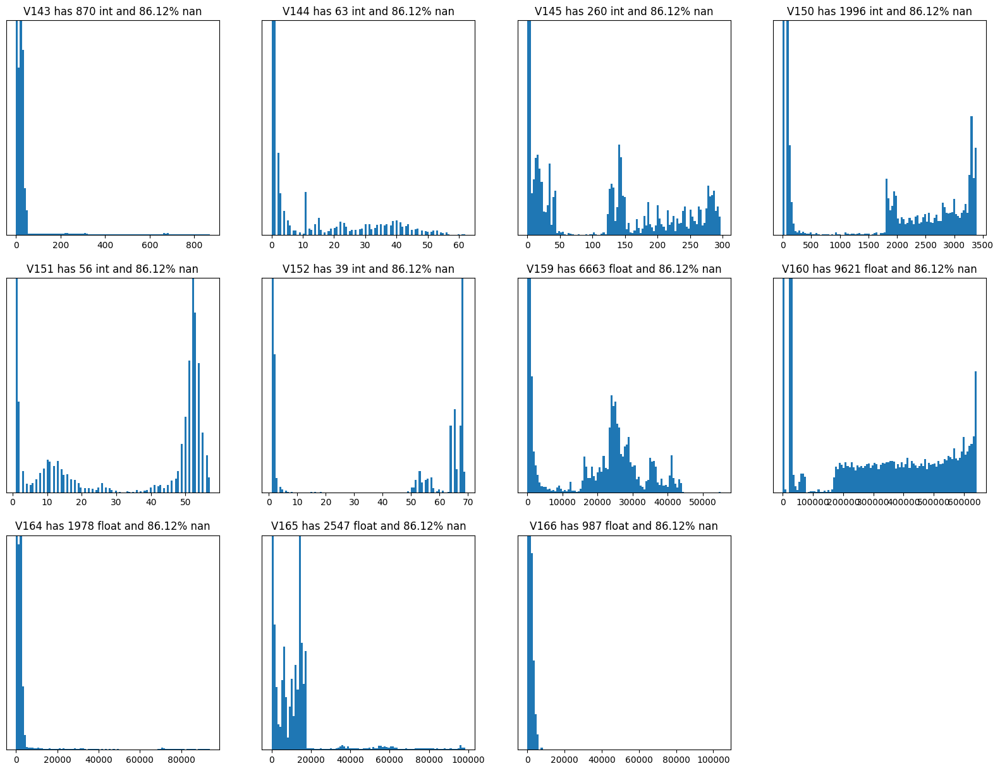

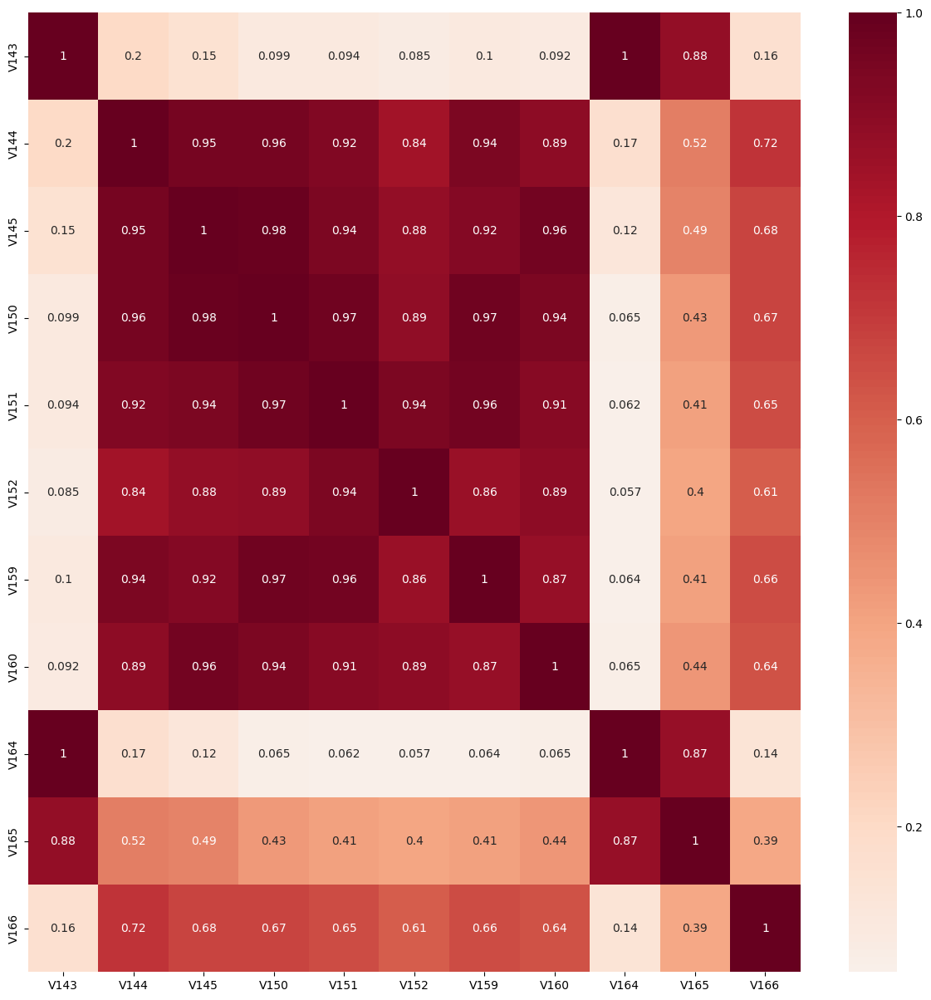

In [ ]:
Vs = nans_groups[508589]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[143,164,165],[144,145,150,151,152,159,160],[166]]
v += reduce_group(grps)

Use these [165, 160, 166]


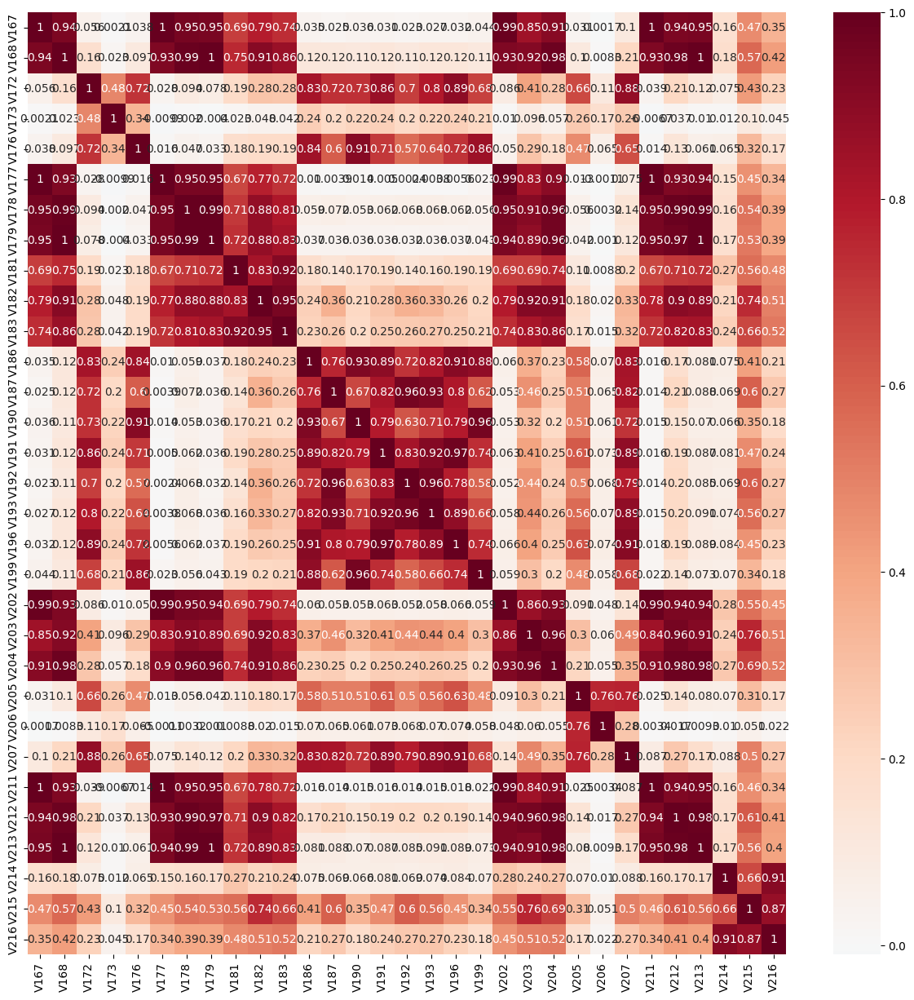

In [ ]:
Vs = nans_groups[450909]
make_corr(Vs)

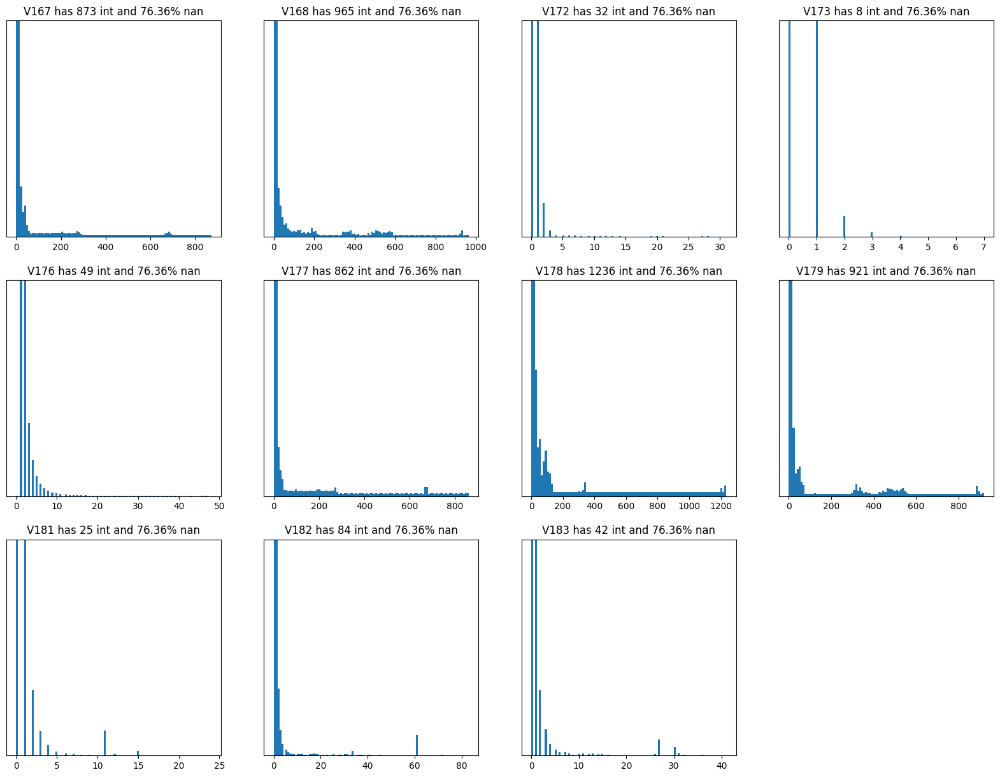

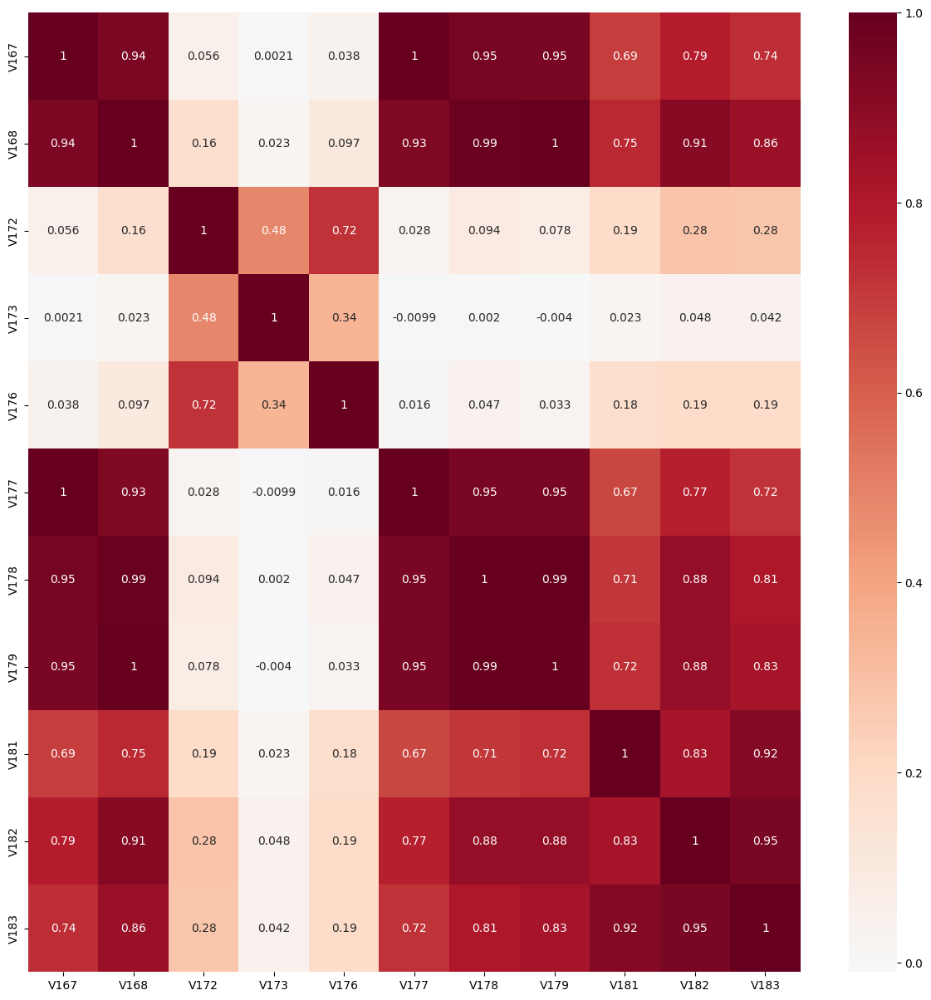

In [ ]:
Vs = [x for x in nans_groups[450909] if int(x[1:])<186]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[167,168,177,178,179],[172,176],[173],[181,182,183]]
v += reduce_group(grps)

Use these [178, 176, 173, 182]


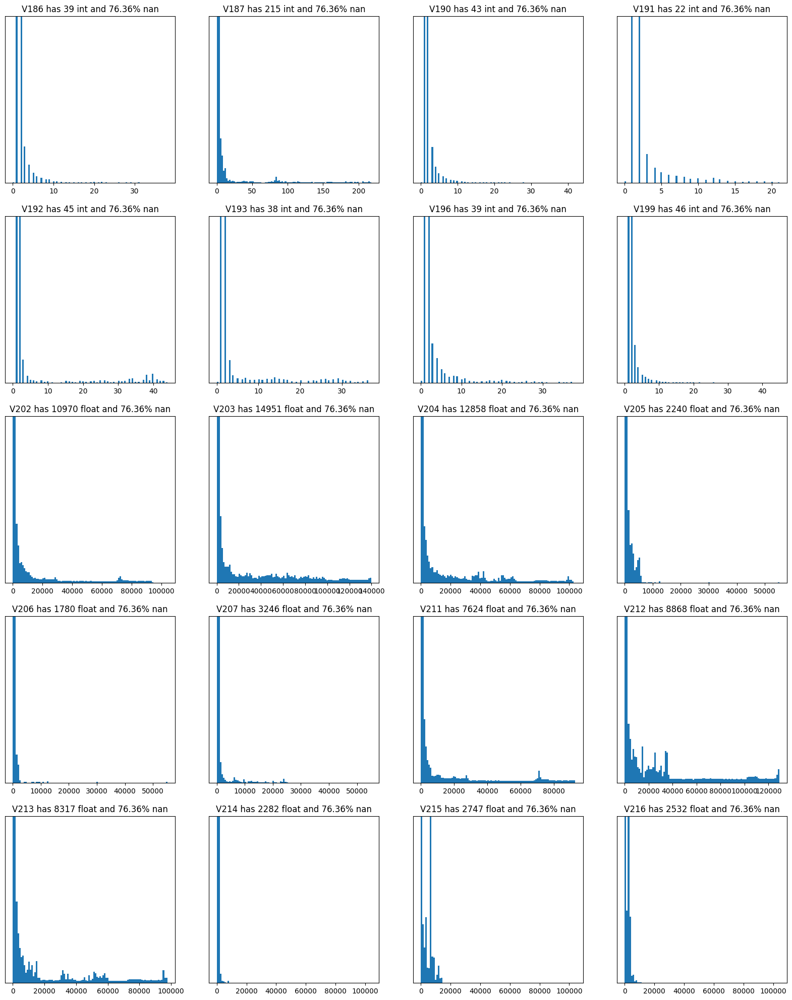

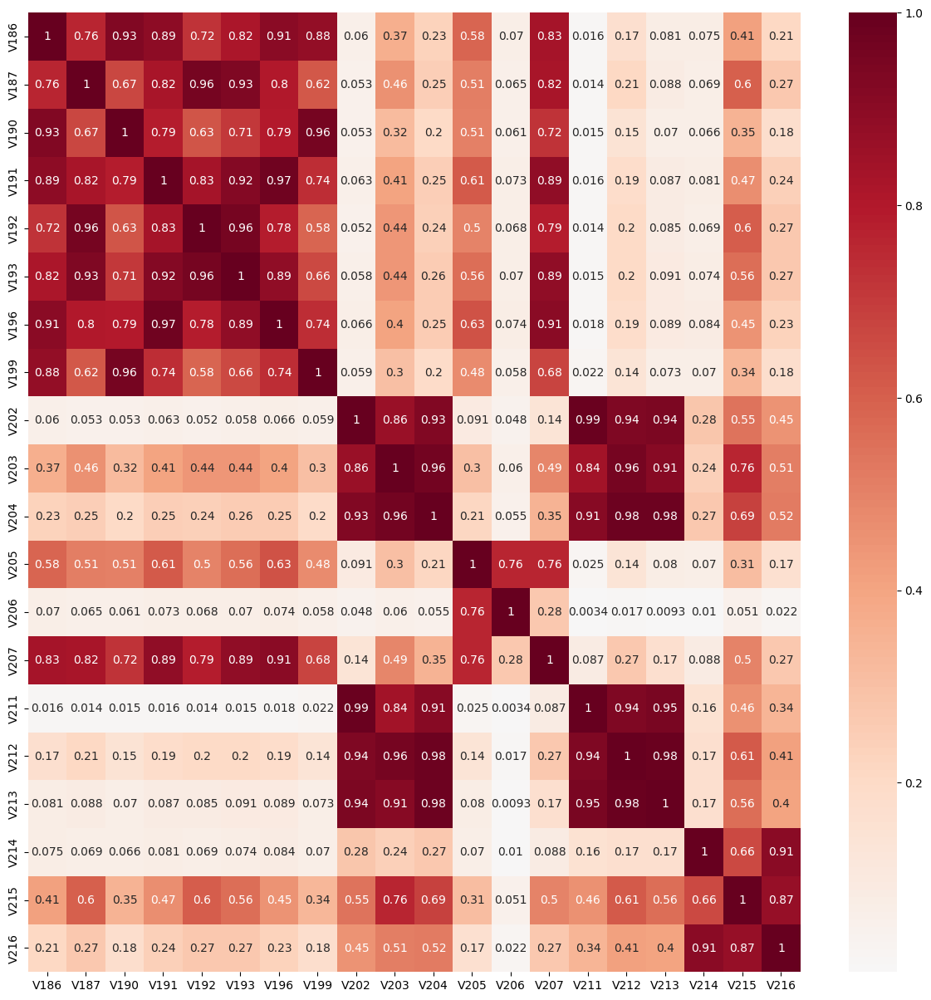

In [ ]:
Vs = [x for x in nans_groups[450909] if (int(x[1:])>183)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[186,187,190,191,192,193,196,199],[202,203,204,211,212,213],[205,206],[207],[214,215,216]]
v += reduce_group(grps)

Use these [187, 203, 205, 207, 215]


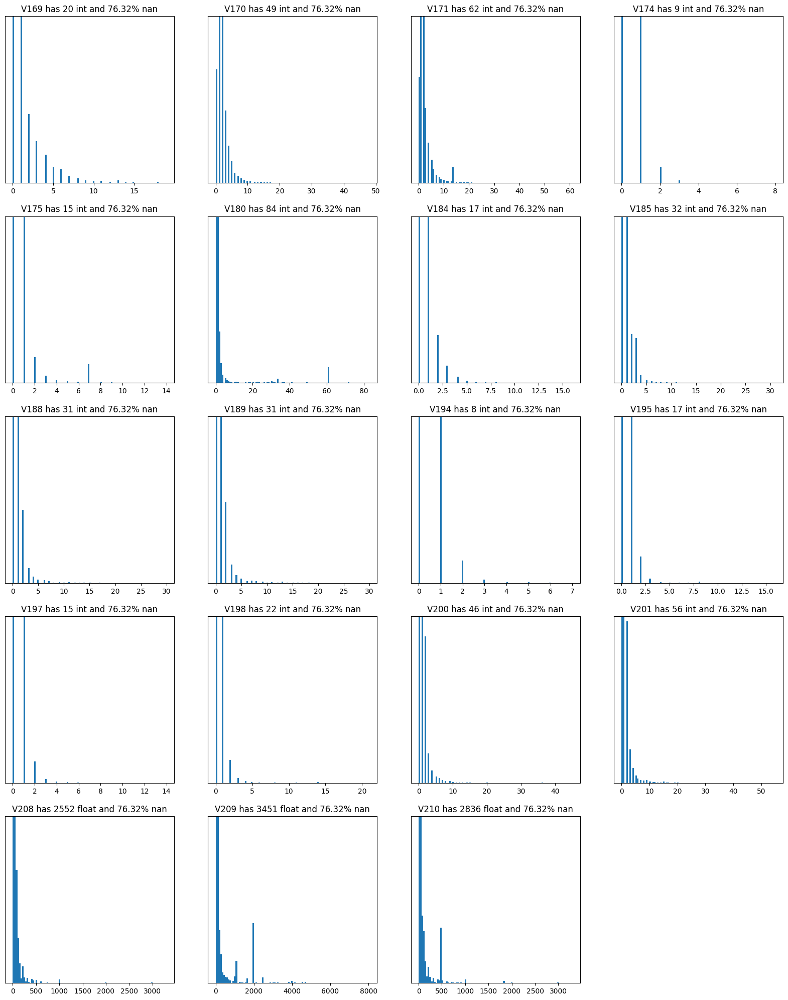

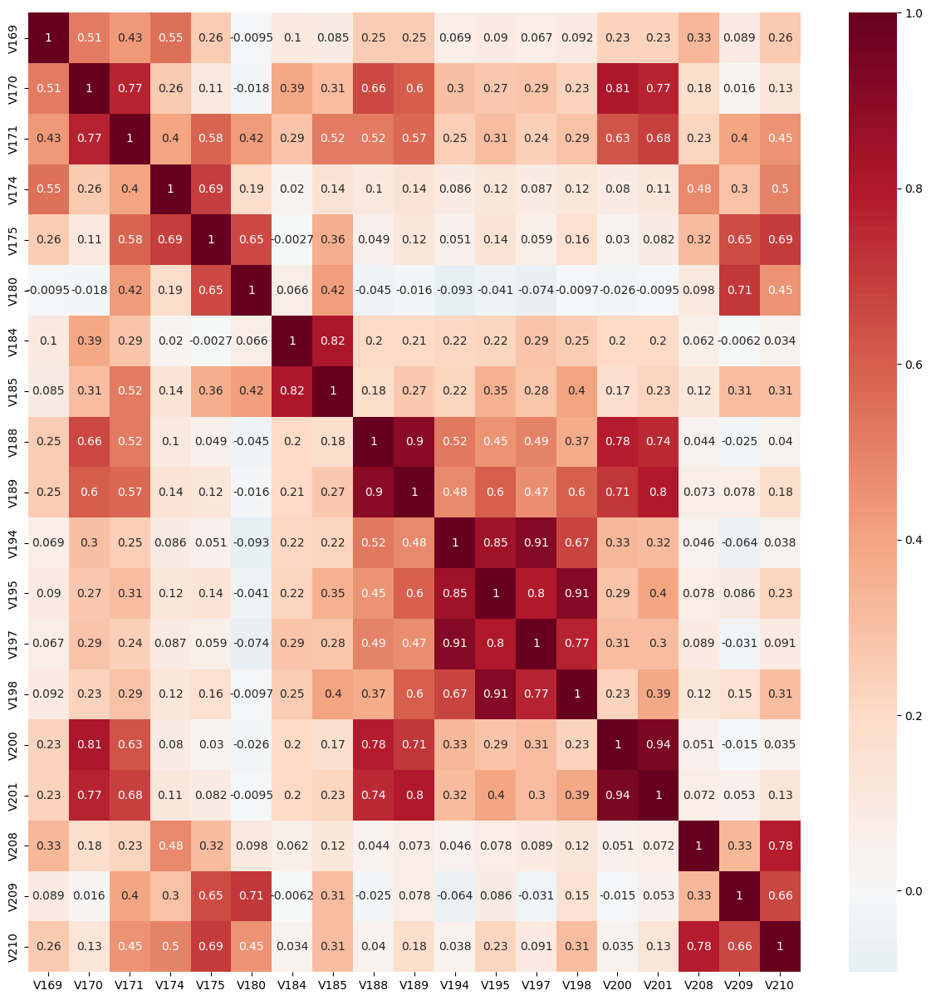

In [ ]:
Vs = nans_groups[450721]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[169],[170,171,200,201],[174,175],[180],[184,185],[188,189],[194,195,197,198],[208,210],[209]]
v += reduce_group(grps)

Use these [169, 171, 175, 180, 185, 188, 198, 210, 209]


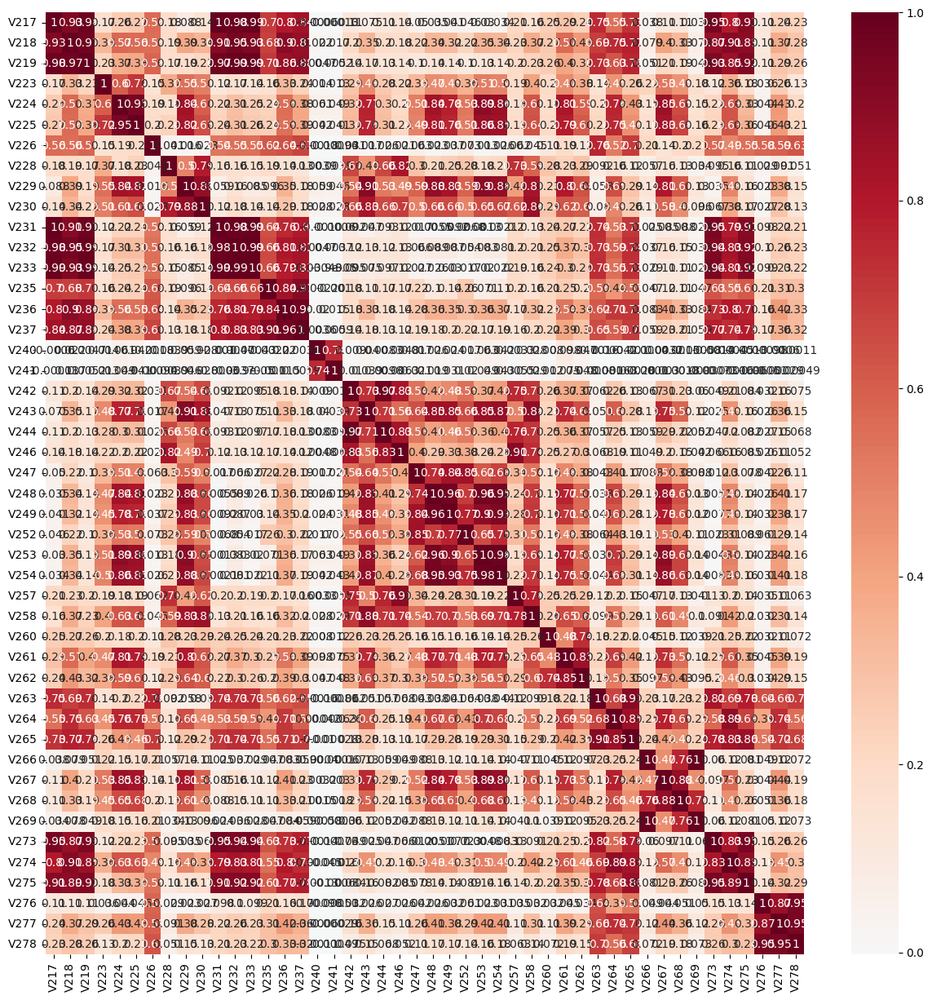

In [ ]:
Vs = [x for x in nans_groups[460110]]
make_corr(Vs)

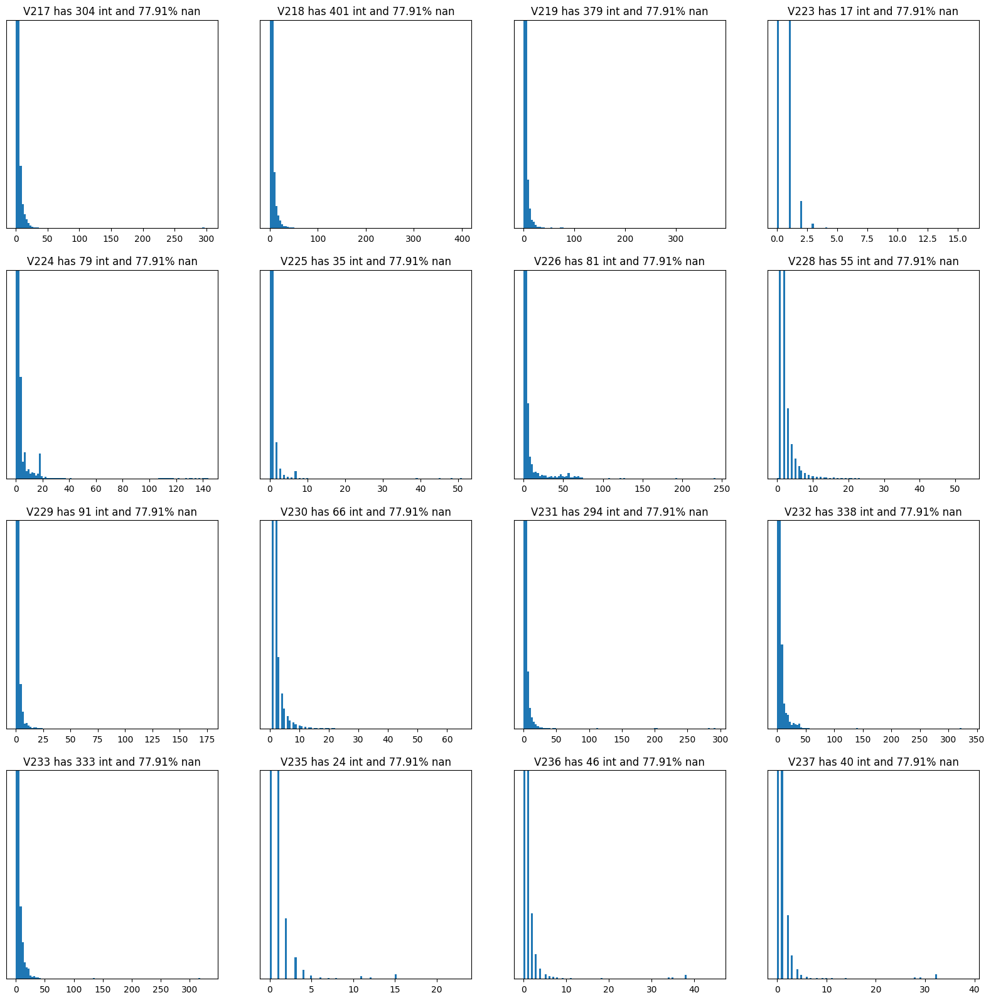

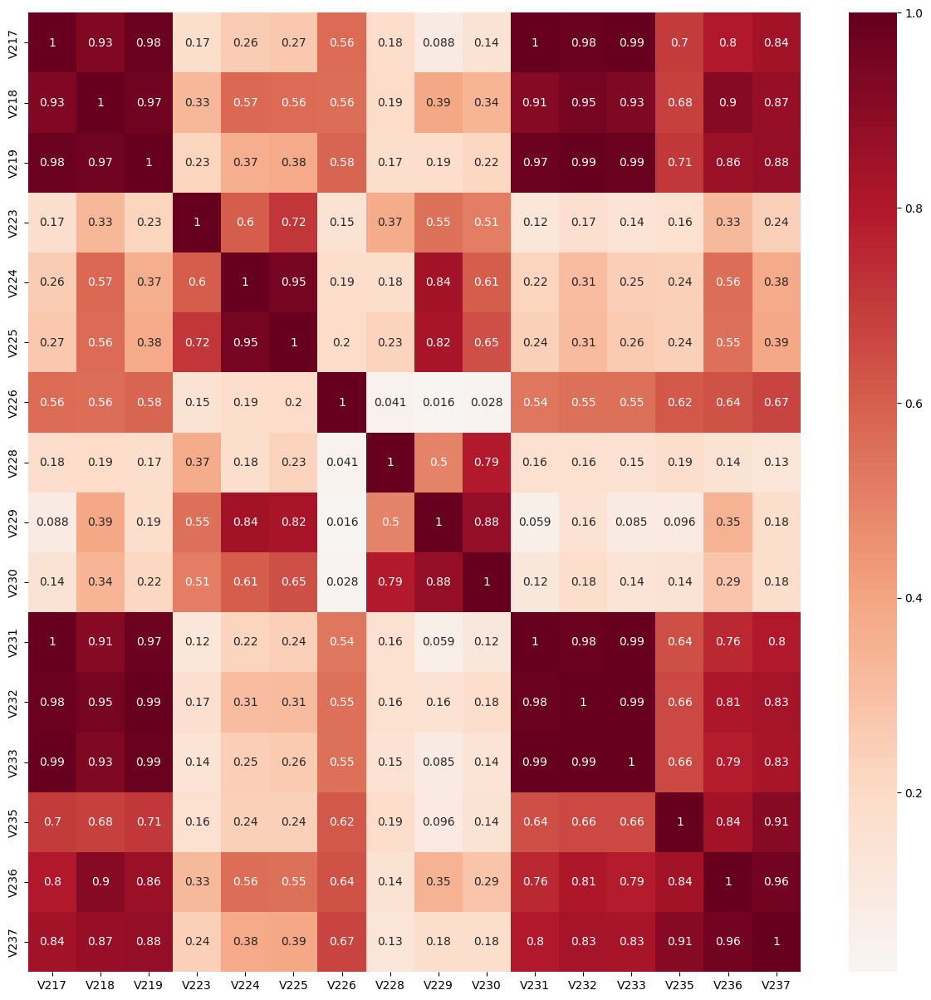

In [ ]:
Vs = [x for x in nans_groups[460110] if int(x[1:])<240]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[217,218,219,231,232,233,236,237],[223],[224,225],[226],[228],[229,230],[235]]
v += reduce_group(grps)

Use these [218, 223, 224, 226, 228, 229, 235]


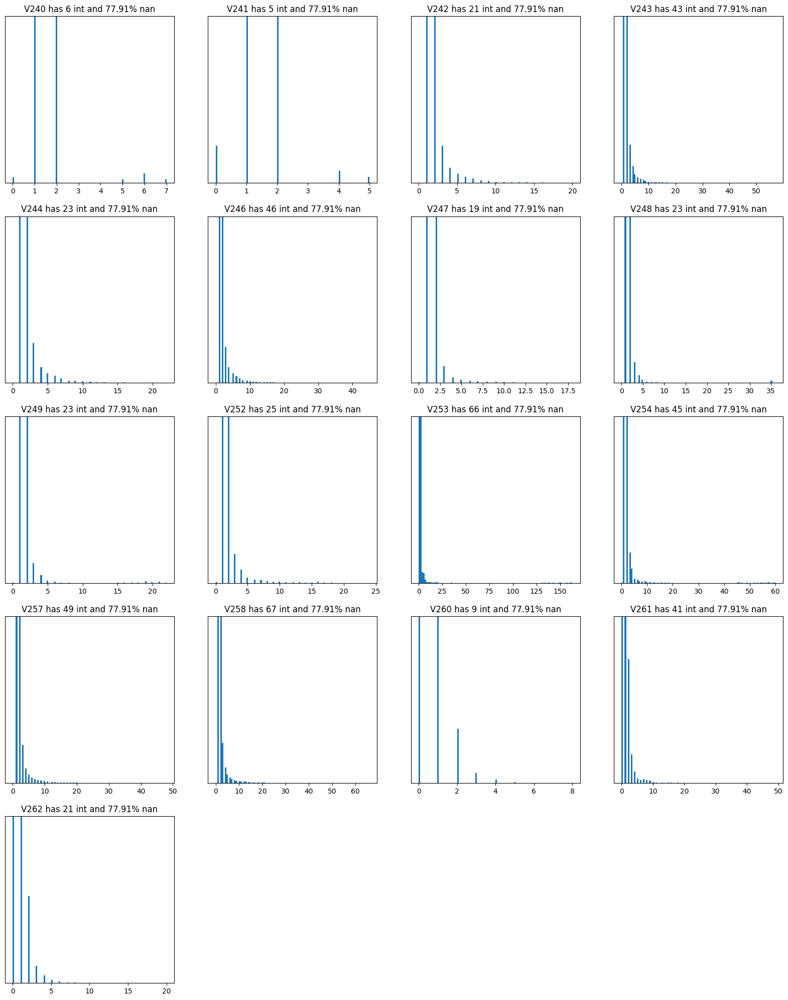

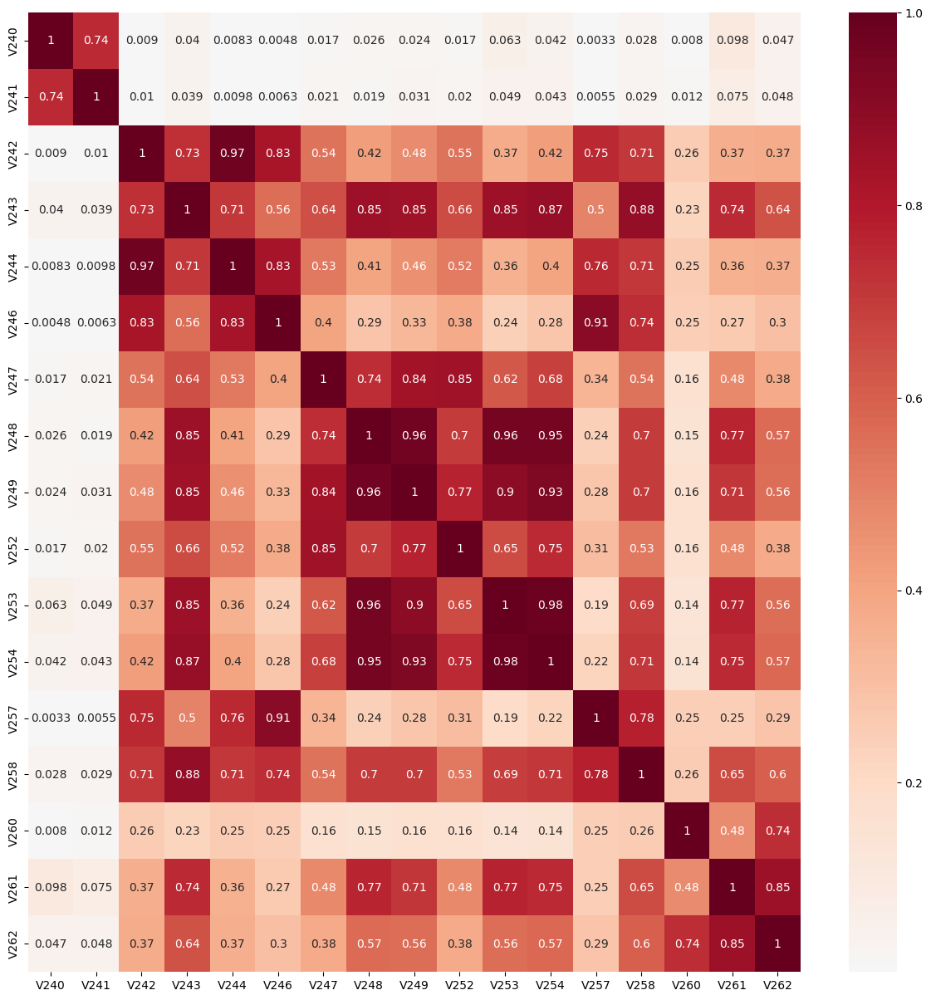

In [ ]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>237)&(int(x[1:])<263)]
make_plots(Vs)
make_corr(Vs)

In [ ]:

grps = [[240,241],[242,243,244,258],[246,257],[247,248,249,253,254],[252],[260],[261,262]]
v += reduce_group(grps)

Use these [240, 258, 257, 253, 252, 260, 261]


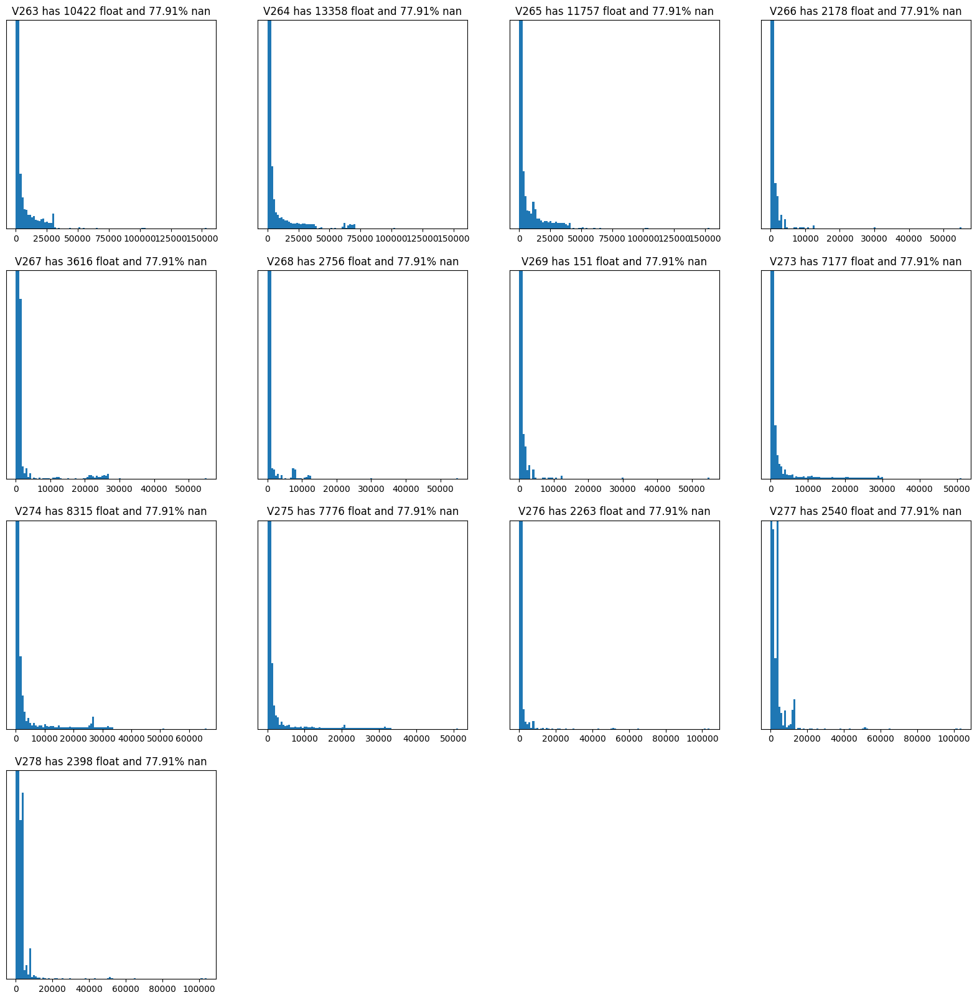

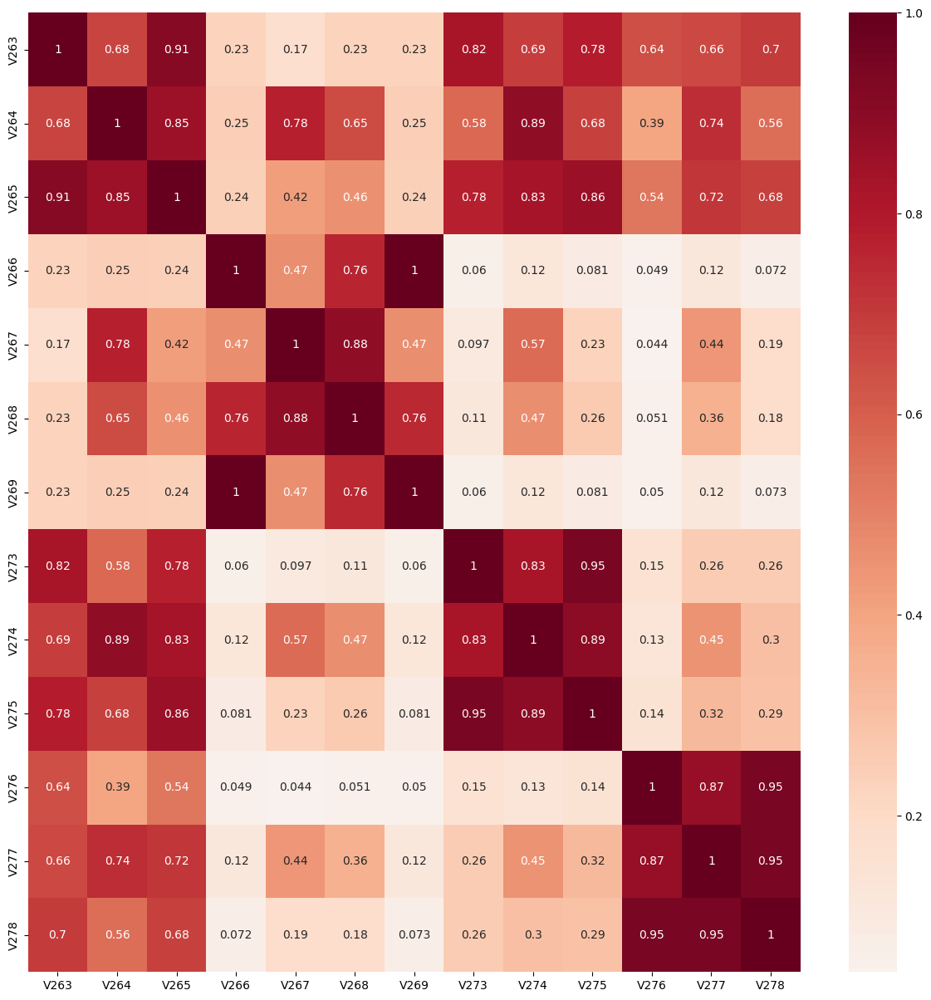

In [ ]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>262)]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[263,265,264],[266,269],[267,268],[273,274,275],[276,277,278]]
v += reduce_group(grps)

Use these [264, 266, 267, 274, 277]


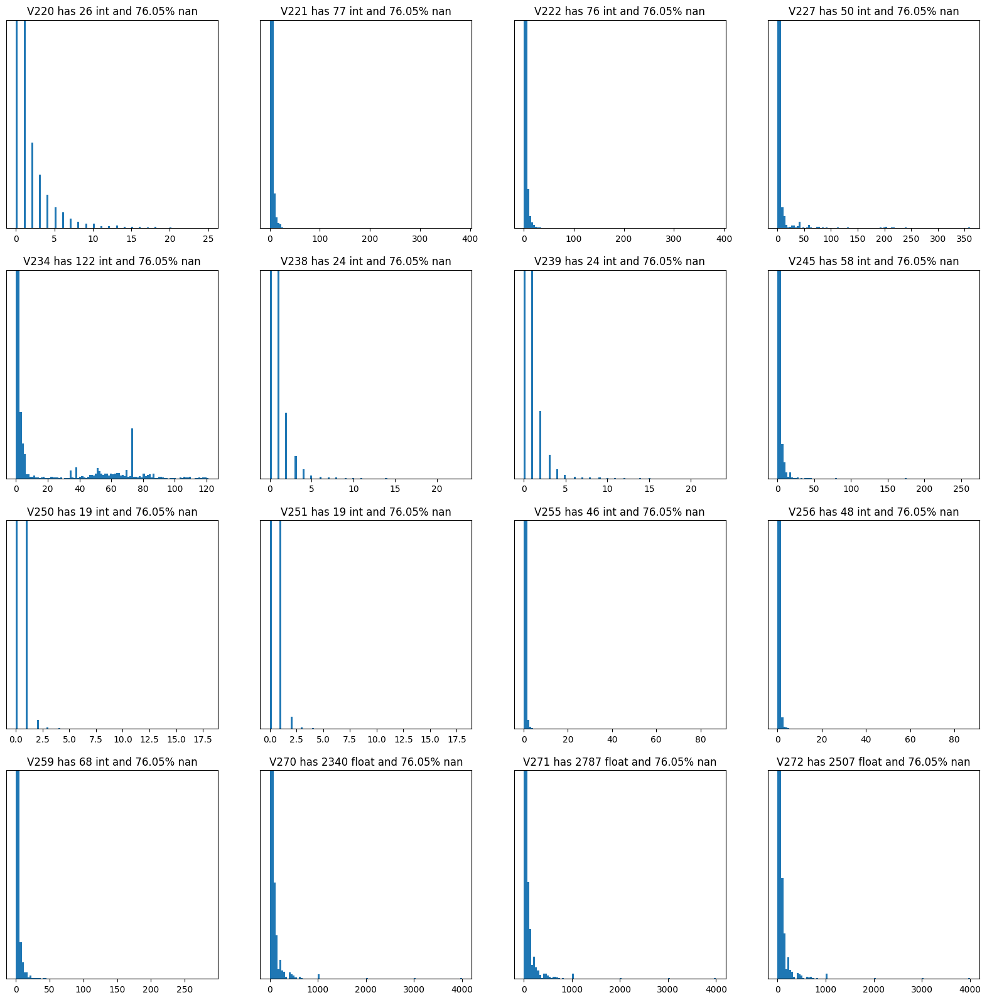

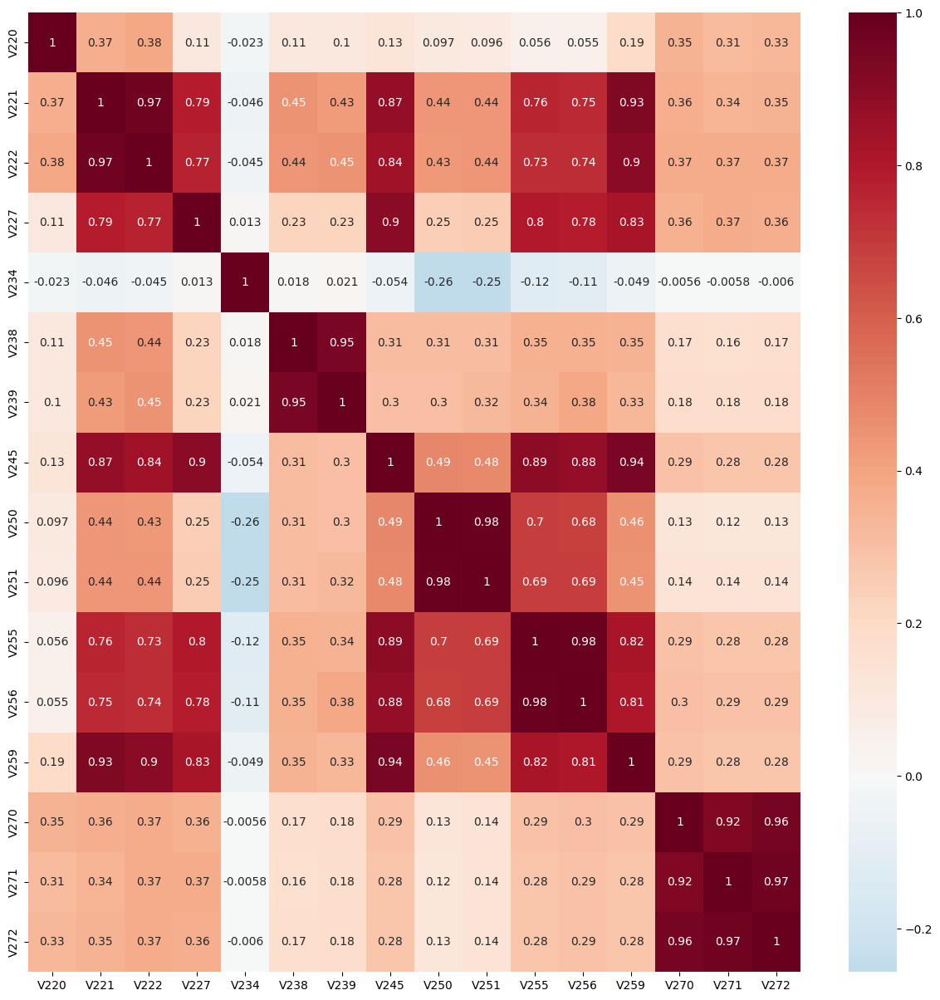

In [ ]:
Vs = nans_groups[449124]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[220],[221,222,227,245,255,256,259],[234],[238,239],[250,251],[270,271,272]]
v += reduce_group(grps)

Use these [220, 221, 234, 238, 250, 271]


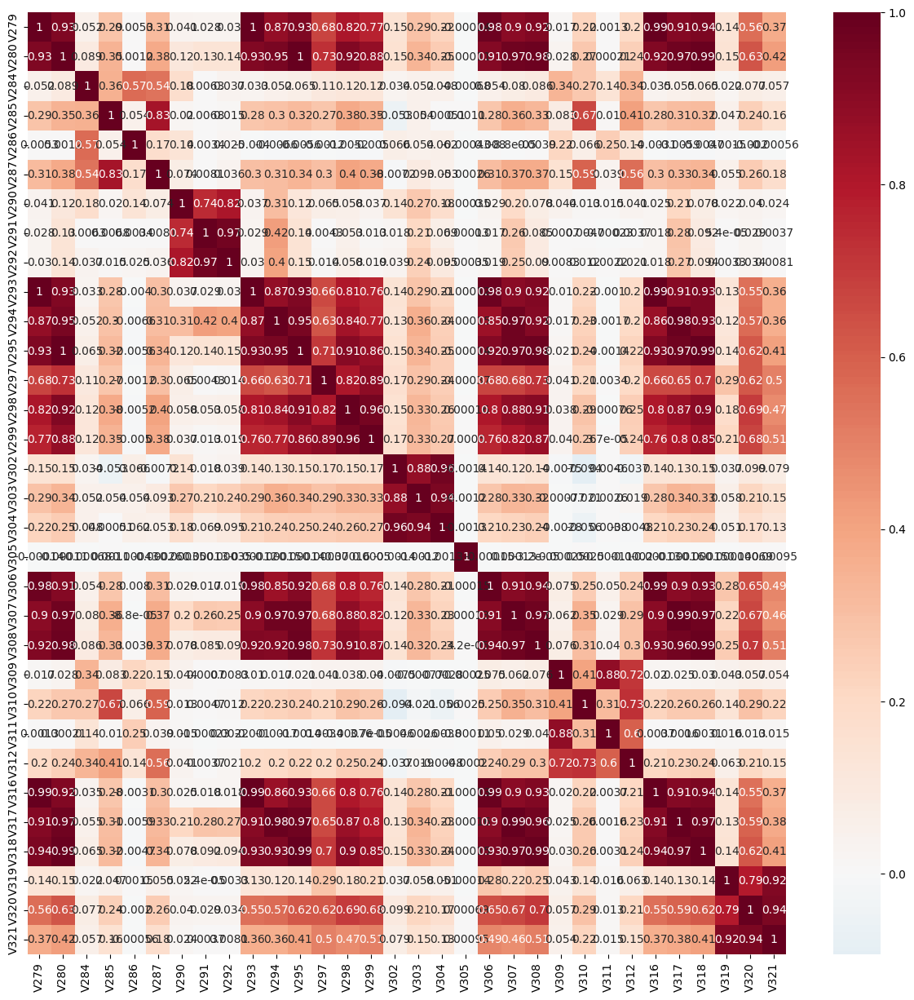

In [ ]:
Vs = nans_groups[12]
make_corr(Vs)

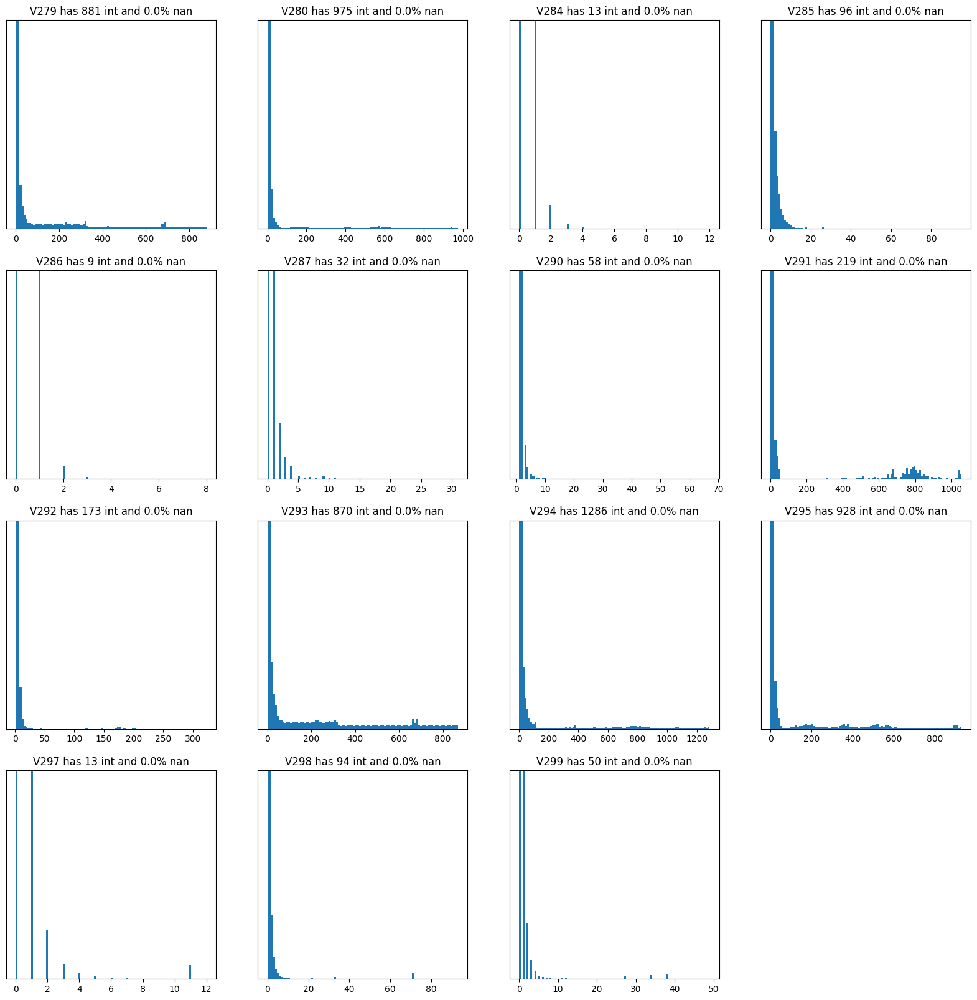

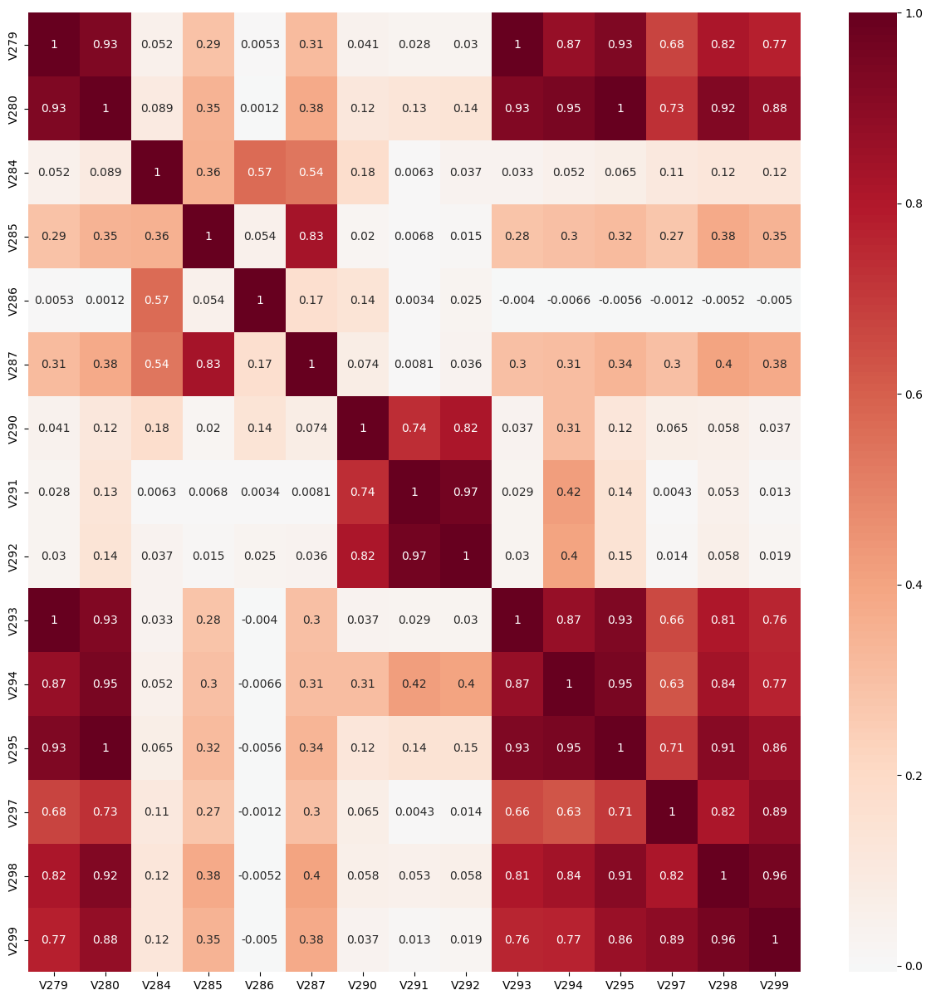

In [ ]:
Vs = [x for x in nans_groups[12] if int(x[1:])<302]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[279,280,293,294,295,298,299],[284],[285,287],[286],[290,291,292],[297]]
v += reduce_group(grps)

Use these [294, 284, 285, 286, 291, 297]


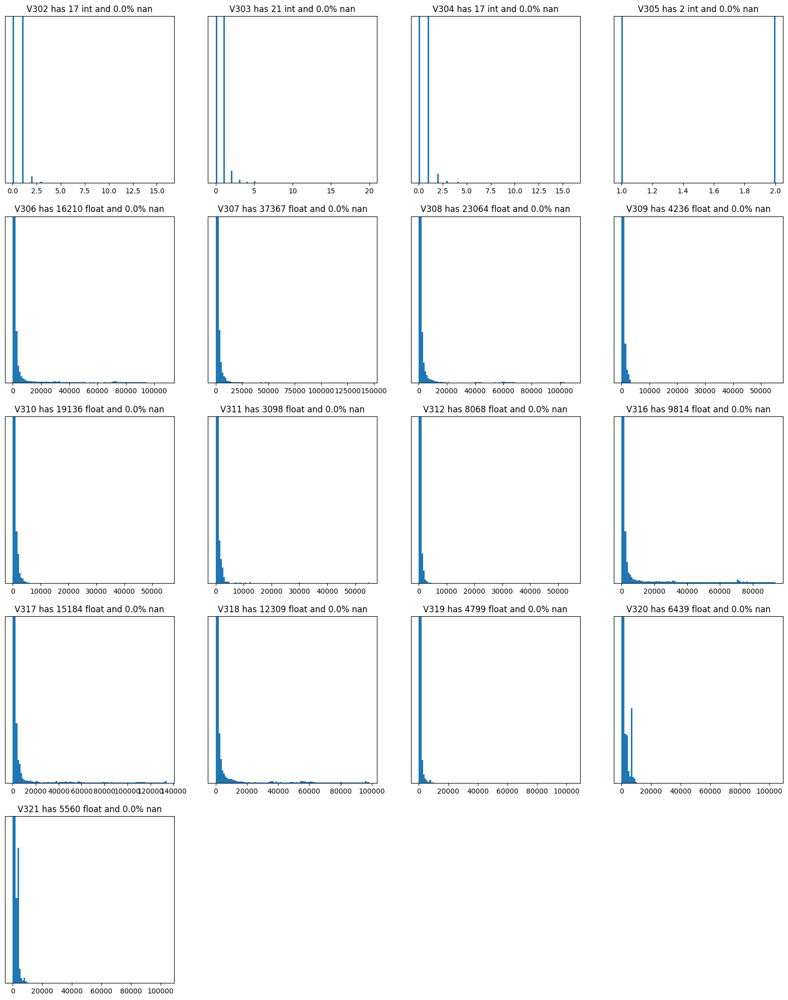

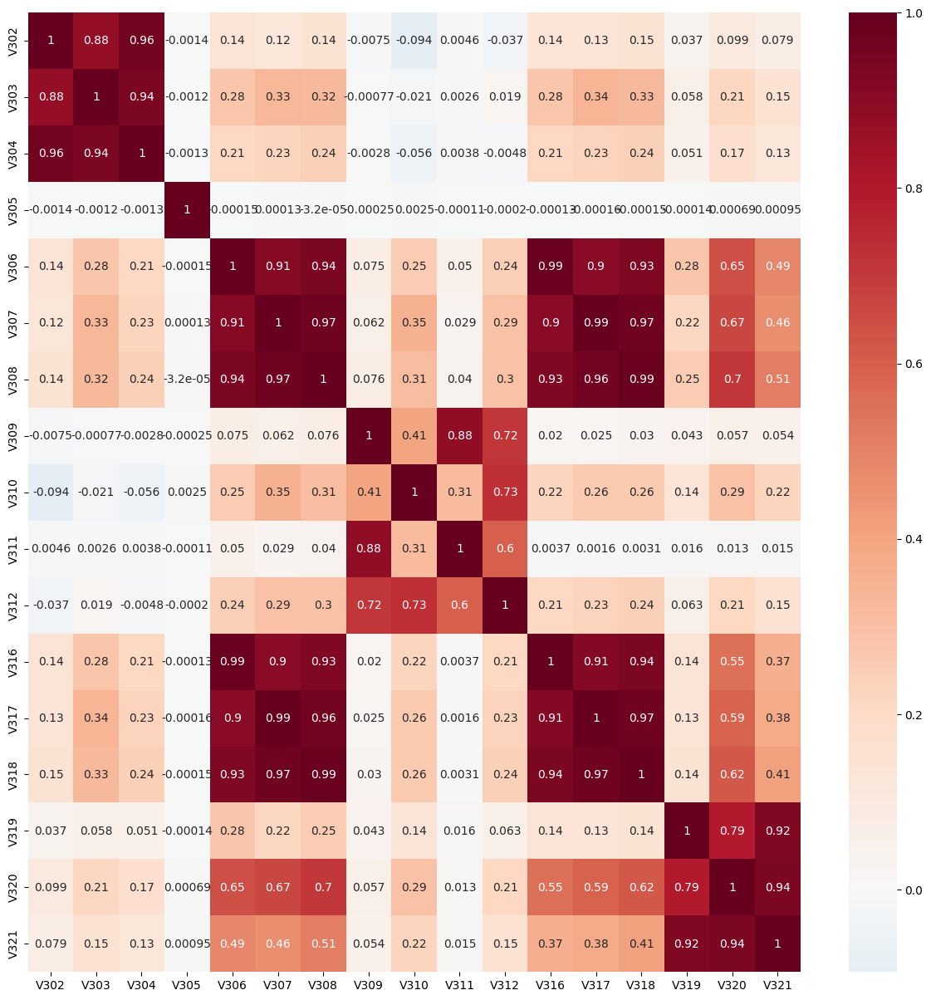

In [ ]:

Vs = [x for x in nans_groups[12] if int(x[1:])>299]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[302,303,304],[305],[306,307,308,316,317,318],[309,311],[310,312],[319,320,321]]
v += reduce_group(grps)

Use these [303, 305, 307, 309, 310, 320]


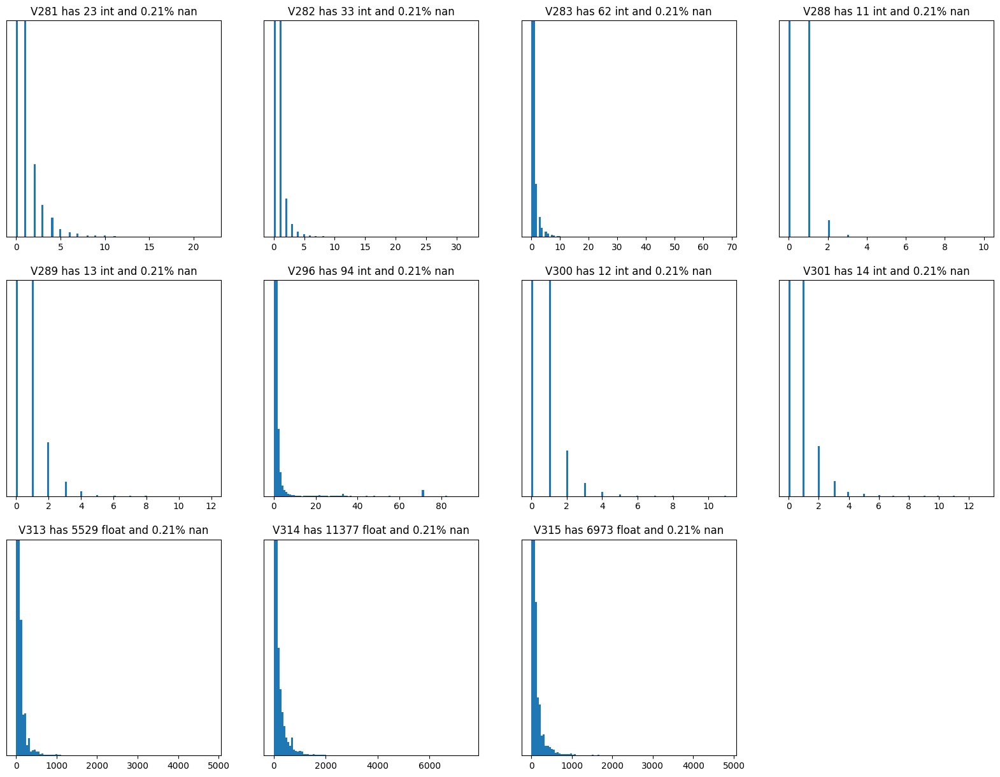

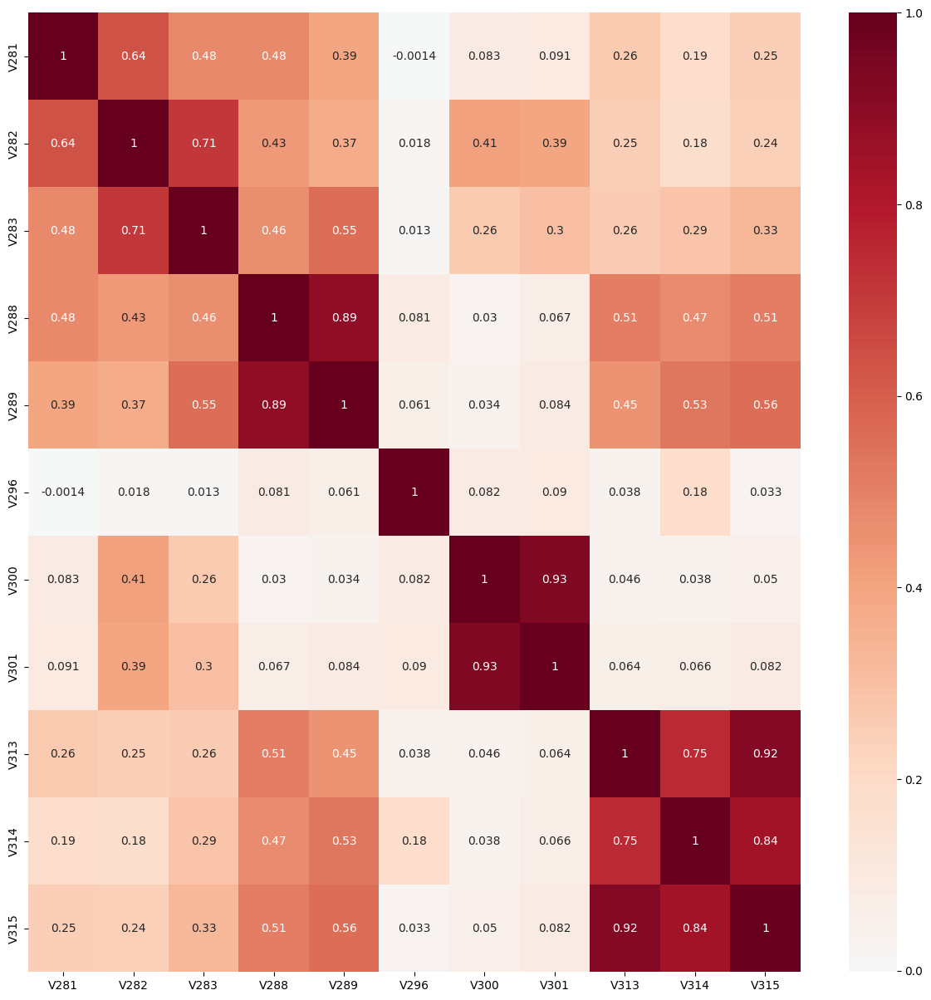

In [ ]:
Vs = nans_groups[1269]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[281],[282,283],[288,289],[296],[300,301],[313,314,315]]
v += reduce_group(grps)

Use these [281, 283, 289, 296, 301, 314]


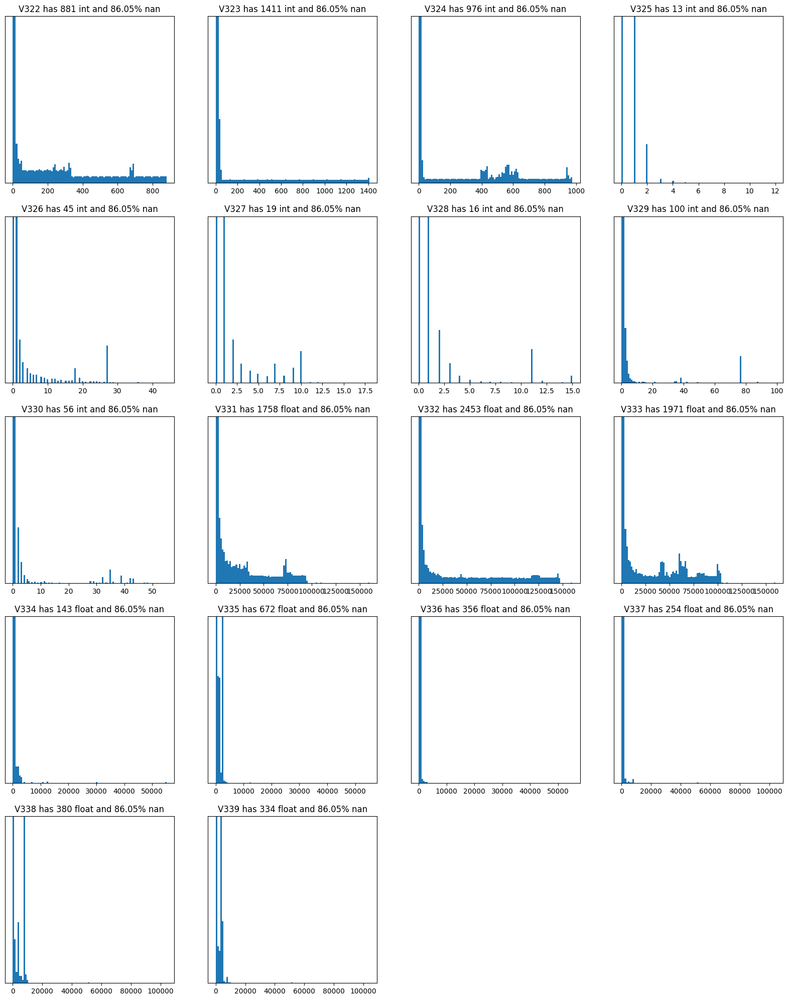

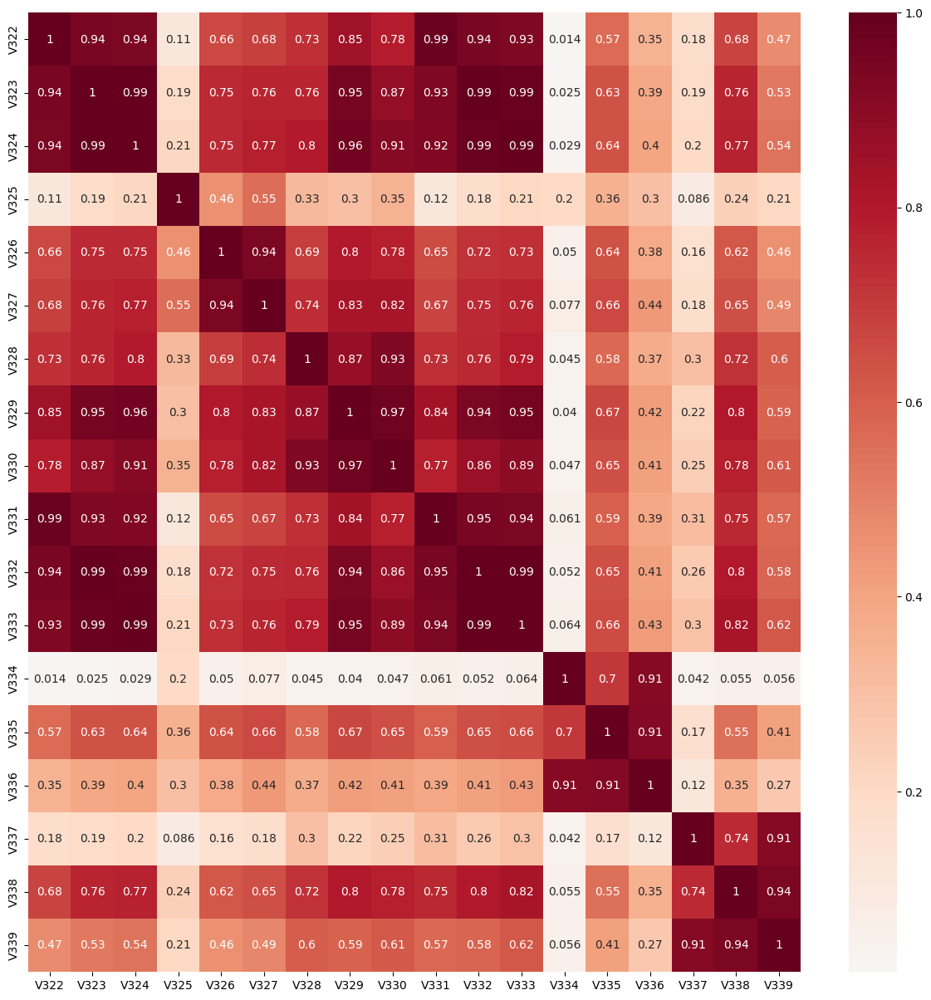

In [ ]:
Vs = nans_groups[508189]
make_plots(Vs)
make_corr(Vs)

In [ ]:
grps = [[322,323,324,326,327,328,329,330,331,332,333],[325],[334,335,336],[337,338,339]]
v += reduce_group(grps)

Use these [332, 325, 335, 338]


In [ ]:
len(v)

128

Từ 339 cột V, sau đó chúng tôi đã giảm được xuống còn 128 cột như sau.

In [ ]:
v_reduced_col = ['V' + str(i) for i in v]
v_reduced_col =  np.array(v_reduced_col)
v_reduced_col

array(['V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17', 'V20',
       'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44',
       'V47', 'V48', 'V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68',
       'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91',
       'V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115',
       'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130',
       'V136', 'V138', 'V139', 'V142', 'V147', 'V156', 'V162', 'V165',
       'V160', 'V166', 'V178', 'V176', 'V173', 'V182', 'V187', 'V203',
       'V205', 'V207', 'V215', 'V169', 'V171', 'V175', 'V180', 'V185',
       'V188', 'V198', 'V210', 'V209', 'V218', 'V223', 'V224', 'V226',
       'V228', 'V229', 'V235', 'V240', 'V258', 'V257', 'V253', 'V252',
       'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277', 'V220',
       'V221', 'V234', 'V238', 'V250', 'V271', 'V294', 'V284', 'V285',
       'V286', 'V291', 'V297', 'V303', 'V305', 'V307', 'V309', 'V310',
       'V32

Trong 128 cột này, chúng tôi tiếp tục tiến hành bỏ đi các cột với số lượng dữ liệu mất đi lớn hơn 80\%.

In [ ]:
df_missing = detectmissing(df_v_col[v_reduced_col])
df_missing

,Name,dtypes,Missing(%),Uniques
0,V1,float64,47.293494,2
1,V3,float64,47.293494,10
2,V4,float64,47.293494,7
3,V6,float64,47.293494,10
4,V8,float64,47.293494,9
5,V11,float64,47.293494,6
6,V13,float64,12.881939,7
7,V14,float64,12.881939,2
8,V17,float64,12.881939,16
9,V20,float64,12.881939,15


In [ ]:
df_missing = df_missing.sort_values(by='Missing(%)', ascending=False)
df_missing

,Name,dtypes,Missing(%),Uniques
55,V139,float64,86.123717,34
54,V138,float64,86.123717,23
56,V142,float64,86.123717,10
57,V147,float64,86.123717,27
58,V156,float64,86.123717,25
59,V162,float64,86.123717,185
60,V165,float64,86.122701,2547
61,V160,float64,86.122701,9621
62,V166,float64,86.122701,987
127,V338,float64,86.054967,380


In [ ]:
# các cột V có số lượng missing < 80% sẽ được giữ
final_v_columns = df_missing[df_missing['Missing(%)'] < 80]['Name']
final_v_columns

94     V261
82     V223
99     V277
98     V274
97     V267
96     V266
93     V260
81     V218
84     V226
83     V224
86     V229
92     V252
85     V228
91     V253
90     V257
89     V258
88     V240
87     V235
95     V264
63     V178
65     V173
66     V182
67     V187
68     V203
69     V205
71     V215
70     V207
64     V176
73     V171
80     V209
74     V175
75     V180
76     V185
77     V188
72     V169
78     V198
79     V210
105    V271
104    V250
103    V238
102    V234
101    V221
100    V220
1        V3
0        V1
5       V11
4        V8
3        V6
2        V4
19      V47
18      V44
17      V41
16      V40
14      V36
15      V37
20      V48
35      V89
36      V91
29      V76
30      V78
31      V80
32      V82
33      V86
34      V88
23      V59
25      V65
21      V54
22      V56
26      V67
28      V70
27      V68
24      V62
12      V27
7       V14
8       V17
9       V20
10      V23
11      V26
6       V13
13      V30
123    V314
122    V301
121    V296
120 

In [ ]:
len(final_v_columns)

115

In [ ]:
# các cột có số lượng missing value >= 80% sẽ bị bỏ
dropped_v_cols = [x for x in v_columns if x not in final_v_columns.values]
len(dropped_v_cols)

224

In [ ]:
# bỏ các cột V với hơn 80% missing values
train = train.drop(dropped_v_cols, axis=1)
train.shape

(590540, 210)

Vì các cột V ở đây có dạng numeric, chúng tôi sẽ thay các giá trị NaNs của mỗi cột bằng giá trị nhỏ nhất của cột đó trừ 2 (min - 2). Việc này nhằm đảm bảo đánh dấu các giá trị NaNs là các giá trị đặc biệt nàm ngoài khoảng dữ liệu của cột.

In [ ]:
for col in final_v_columns.values:
  train[col] = train[col].fillna(train[col].min() - 2)

In [ ]:
del df_v_col
del df_missing